# Estimate spont field in water ice

_Authors: Rachel James (?), Andrew Cassidy (2), David Field (2,3)_

2. [Center for Interstellar Catalysis, Department of Physics and Astronomy, Aarhus University, DK](https://www.phys.au.dk/intercat)
3. [Department of Physics and Astronomy, Aarhus University, DK](https://www.phys.au.dk)


In [2]:
# import image module
from IPython.display import Image
from IPython.display import HTML, Markdown
import math
import numpy, pandas 
import matplotlib.pyplot as plt
import openpyxl
import xlrd
import glob
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy import optimize
import pandas as pd
from os import listdir
from collections import defaultdict
import os
from scipy import __version__
import seaborn as sns
import sympy as sp


print(os.getcwd())


C:\Users\au302163\Github\VUV_water_spont


### Abstract <a class="anchor" id="abstract"></a>
If water is polarised at all temperature of growth. Below 120 K (ish) this is asscoaited with pores, i.e., amorphous water is polarised becuase of dangling H bonds inside pores. But above 120 K, until desorption, water is also polarised. i.e., crystalline water is polarised. We aim here to see if crystalline water is spontelectric. If so, then the temperature dependence of the field induced shift in VUV peak positions, is caused by the spontectric field. That is, the magnitiude of the field that produces a shift (based on the exciton model) can be explained by fitting the field data with the spontelectric model!

### The how of if<a class="anchor" id="how?"></a>
water was deposited at a range of temperatures and VUV spectra were recorded. Rachel James fit these spectra with Gausians and provided peak positions

We propose that one of these peaks shifts with temperature because some electric field, called E$_{SP}$, acts to expand the size of the exciton related to this peak. The temperature dependence of this effect, *i.e*, the field effect on the size of the exicton is given by **Eqn. 1**

[Eqn. 1]<a class="anchor" id="equation_1"></a>
\begin{align}
\mathrm{(1)} \quad \Delta E = 2 \Delta r E_{SP}
\end{align}

If we start with some value of r and estimate a value for $\Delta E$ from the spectra, we can calculate $E_{SP}$ using the equation in figure 2

### Figure 1: Water VUV spectra at all temperatures  <a class="anchor" id="figure_1"></a>
![Water_VUV_Spectra](images/water_all_markers.png)

Rachel fit these spectra with 2 Gaussians to extact the peak positions, indicated with dots:

![water_G_all](water_spont_peaks.png)
**Figure 2**: We are interested in the last 5 points, above 125 K in this figure. The abosrbances used to find the peak positions in the upper row fal between the two verticle blue lines

This is stage 1 of 4 stages as accurately laid out in figure 3.
### Figure 3: Mind splat in the catalytic space one day  <a class="anchor" id="figure_3"></a>
![mindsplat](images/mindsplat.jpg)


**Stage 1**: Find $E_{SP}$

**Stage 2**: Convert $E_{SP}$ into $(\langle\mu_z\rangle/\mu)$ using:
[Eqn. 2]<a class="anchor" id="equation_2"></a>
\begin{align}
\mathrm{(2)} \quad E_{SP} = E_{A} \langle\mu_z\rangle/\mu
\end{align}

**Stage 3**:
Use the Spontelectric model developed by Frank to derive caluclated values of  $E_{SP}$ and $(\langle\mu_z\rangle/\mu)$; for these assumed values of "r" and $\lambda_{0}$

**Stage 4**:
take the residuals between the calculated and observed values of $E_{SP}$ and/or $(\langle\mu_z\rangle/\mu)$ and use a matrix plot to find the best [r:$\lambda_{0}$]space


### Stage 1: Calculate $E_{SP}$


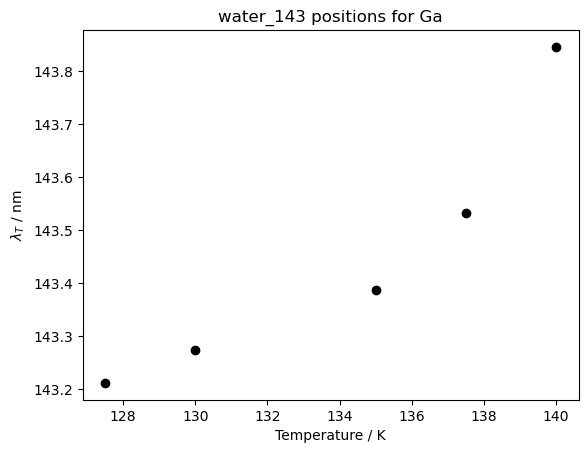

Text(0, 0.5, 'Energy shift from $\\lambda_{0}$ / eV')

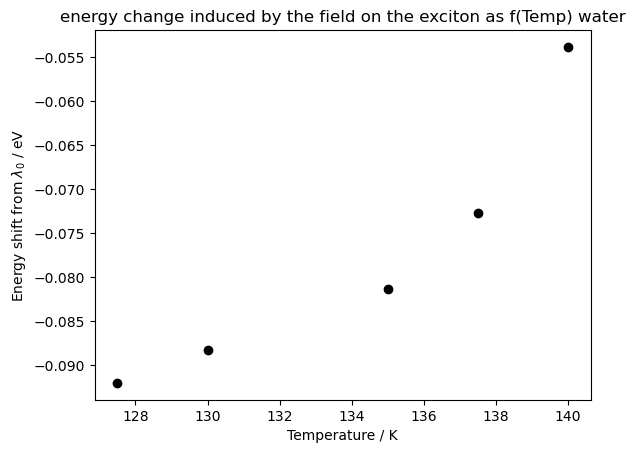

In [32]:
#What molecule are we looking at?
name='water'

#---
### There are two choices here, either fit the 143 nm peak or the 155 nm peak ###
#---

filename='water_143 positions for Gauss2' #these peak positins come from Rachel's Gaussian fits to water data. 

df = pd.read_csv(filename+'.txt', delim_whitespace=True, header=(0))
#df =  df_all#.head(5) #because there are two data points for films grown at 140 K, and we chose to use the data from the thinner film

if int(filename[6:9]) == 155:
    l0= 157 # lambda_0 in nm 
    
else:
    l0 = 144.75
    
xdataraw = (df.iloc[:,0]) #Temperature K
ydataraw = (df.iloc[:,1]) #peak position nm

xdata = xdataraw*3.16683e-6 #convert Temperature to au
ydata = (ydataraw*1e-9)/5.29177e-11 #convert lambda to au


#Define constants from the literature
eps = 3 #- Kofman_2019_ApJ 
mu_0_Debye = 3 # solid state dipole moment since this is known for water and avoids us recalculating it with topping equation
Omega_SI = 17.35e-30 # volume in m**3 from saga et al. (normally calculated based on polarizability, but don't do it this way for water ice).
Omega = Omega_SI*18897259886**3 # convert volume to au
s_nm = 0.37 # David provided this value
density = 1

#mu_g_Debye = 1.6489 # D gas phase dipole (MeOH = 1.6489)
#mu_g = (mu_g_Debye*0.393456)  #  gas phase dipole converted to au
#a_SI = 3.31e-30 # polarizability in m**3
#a = a_SI*18897259886**3   # polarizability in au
#k_constant = 11.034          # k value

#set up limits for future graphs
T_array=xdataraw.to_numpy()
xmin_mu=min(T_array - 10)
xmax_mu=max(T_array + 10)

xmin=min(T_array - 10)
xmax=max(T_array + 10)

#plot the raw data to check it's correct
plt.plot(xdataraw, ydataraw,'ko')
#plt.title('raw data '+ name)
plt.xlabel('Temperature / K')
plt.ylabel('$\lambda_{T}$ / nm')
plt.title(filename[:-4])
plt.show()

###---
### Now we agree on the data, calculate the energy difference between lambda max ( at each Tdep) and Lambda0 in eV:
###---

#Convert lambda max to eV
lambda_nm=ydataraw
lambda_eV=1239.8/lambda_nm

#Define wavelength with no field - lambda0 in eV
l0_eV=1239.8/l0

#Calculate DE as -ve number (as test) i.e., long wavelength - short wavelength
DE_eV=(l0_eV-lambda_eV)
#convert things to atomic units
T=xdataraw*3.16683e-6
DE=DE_eV*0.036749405469679

plt.plot(xdataraw, DE_eV,'ko')
plt.title('energy change induced by the field on the exciton as f(Temp) ' +name)
plt.xlabel('Temperature / K')
plt.ylabel('Energy shift from $\lambda_{0}$ / eV')

#print('energy difference between peak position (eV) and ', l0_eV , '(eV) is: \n', DE_eV)
#print('and this energy difference converted to au is \n', DE)

In [33]:

### Define some functions for the exciton model

def Solid_phase_dipole(density):
    
    mu_0_Debye = 3 #fixed for water
        
    return mu_0_Debye
        
def Observed_Esp_David(r, DE): # r in au
#
# gives the observed value of Espont for some value of radius and the observed value of DE
# NOTE that the value of DE is defined by the measured peak position and the estimated value of lambda_0 
 
    Esp_au_David = (1/96)*(-((32*DE)/radius)+((16*(2**(1/3))*DE*(6+DE*eps*radius))/(radius**3 * ((((DE**2*eps**2 *radius**(0.5))*(-9+2*DE*eps*radius))+3*(3**(0.5))*(-DE**3 *eps**3 *(32+DE*eps*radius*(13+4*DE*eps*radius)))**0.5)/(radius**(9/2)))**(1/3)))+((8*(2**(2/3))*((((DE**2 *eps**2 *radius**(0.5))*(-9+2*DE*eps*radius))+3*(3**(0.5))*(-DE**3 *eps**3 *(32+DE*eps*radius*(13+4*DE*eps*radius)))**0.5)/(radius**(9/2)))**(1/3))/(eps)))
    Esp_David = Esp_au_David*5.14220652e+11
    return Esp_David

def Franks_pee_function(r, DE): # r in au
    pee = (r*DE)
    return pee

def Franks_function_f(r): # r in au
    function_f = 1/12/r/r
    return function_f

def Franks_function_g(r,DE): # r in au
    col_C = (-(eps**3)*(Franks_pee_function(r,DE)**3)*(32+(eps*Franks_pee_function(r,DE))*(13+4*(eps*Franks_pee_function(r,DE)))))**(1/2)
    var_D = (((eps**2)*(Franks_pee_function(r,DE)**2)*(-9+2*(eps*Franks_pee_function(r,DE))))+3*((3)**(0.5))*col_C)**(1/3)
    function_g = -4*Franks_pee_function(r,DE)+((2*(2**(1/3))*Franks_pee_function(r,DE)*(6+Franks_pee_function(r,DE)*eps))/var_D)+(((2**(2/3))*var_D)/eps)
    return function_g
    
def Franks_function_h(r,DE): # r in au
    col_C = (-(eps**3)*(Franks_pee_function(r,DE)**3)*(32+(eps*Franks_pee_function(r,DE))*(13+4*(eps*Franks_pee_function(r,DE)))))**(1/2)
    var_D = (((eps**2)*(Franks_pee_function(r,DE)**2)*(-9+2*(eps*Franks_pee_function(r,DE))))+3*((3)**(0.5))*col_C)**(1/3)
    dD_dp = (1/3)*(((Franks_pee_function(r,DE)**2)*(eps**2)*(-9+2*Franks_pee_function(r,DE)*eps)+(3*(3**0.5)*(col_C)))**(-2/3))*(Franks_pee_function(r,DE)*(eps**2)*(-18+6*Franks_pee_function(r,DE)*eps)+1.5*(3**0.5)*(1/col_C)*(-(Franks_pee_function(r,DE)**2)*(eps**3)*(96+Franks_pee_function(r,DE)*eps*(52+20*Franks_pee_function(r,DE)*eps))))
    #ddD_dpp = 0.0699868424736149*(-5.1971292993621*Franks_pee_function(r, DE)**2*(1.5876*Franks_pee_function(r, DE)*(31.752*Franks_pee_function(r, DE) + 52) + 96)/(-Franks_pee_function(r, DE)**3*(1.5876*Franks_pee_function(r, DE)*(6.3504*Franks_pee_function(r, DE) + 13) + 32))**0.5 + 2.52047376*Franks_pee_function(r, DE)*(9.5256*Franks_pee_function(r, DE) - 18))*(-0.513296720924652*Franks_pee_function(r, DE)**2 - 0.32331615074619*Franks_pee_function(r, DE)*(3.1752*Franks_pee_function(r, DE) - 9) + 0.666666666666667*(-Franks_pee_function(r, DE)**3*(1.5876*Franks_pee_function(r, DE)*(6.3504*Franks_pee_function(r, DE) + 13) + 32))**0.5*(-0.5*Franks_pee_function(r, DE)**3*(20.16379008*Franks_pee_function(r, DE) + 20.6388) - 1.5*Franks_pee_function(r, DE)**2*(1.5876*Franks_pee_function(r, DE)*(6.3504*Franks_pee_function(r, DE) + 13) + 32))/(Franks_pee_function(r, DE)**3*(1.5876*Franks_pee_function(r, DE)*(6.3504*Franks_pee_function(r, DE) + 13) + 32)))/(0.242487113059643*Franks_pee_function(r, DE)**2*(3.1752*Franks_pee_function(r, DE) - 9) + (-Franks_pee_function(r, DE)**3*(1.5876*Franks_pee_function(r, DE)*(6.3504*Franks_pee_function(r, DE) + 13) + 32))**0.5)**1.66666666666667 + 0.0699868424736149*(-5.1971292993621*Franks_pee_function(r, DE)**2*(100.8189504*Franks_pee_function(r, DE) + 82.5552)/(-Franks_pee_function(r, DE)**3*(1.5876*Franks_pee_function(r, DE)*(6.3504*Franks_pee_function(r, DE) + 13) + 32))**0.5 - 10.3942585987242*Franks_pee_function(r, DE)*(1.5876*Franks_pee_function(r, DE)*(31.752*Franks_pee_function(r, DE) + 52) + 96)/(-Franks_pee_function(r, DE)**3*(1.5876*Franks_pee_function(r, DE)*(6.3504*Franks_pee_function(r, DE) + 13) + 32))**0.5 + 48.018049696512*Franks_pee_function(r, DE) - 45.36852768 + 5.1971292993621*(1.5876*Franks_pee_function(r, DE)*(31.752*Franks_pee_function(r, DE) + 52) + 96)*(0.5*Franks_pee_function(r, DE)**3*(20.16379008*Franks_pee_function(r, DE) + 20.6388) + 1.5*Franks_pee_function(r, DE)**2*(1.5876*Franks_pee_function(r, DE)*(6.3504*Franks_pee_function(r, DE) + 13) + 32))/(Franks_pee_function(r, DE)*(-Franks_pee_function(r, DE)**3*(1.5876*Franks_pee_function(r, DE)*(6.3504*Franks_pee_function(r, DE) + 13) + 32))**0.5*(1.5876*Franks_pee_function(r, DE)*(6.3504*Franks_pee_function(r, DE) + 13) + 32)))/(0.242487113059643*Franks_pee_function(r, DE)**2*(3.1752*Franks_pee_function(r, DE) - 9) + (-Franks_pee_function(r, DE)**3*(1.5876*Franks_pee_function(r, DE)*(6.3504*Franks_pee_function(r, DE) + 13) + 32))**0.5)**0.666666666666667        
    ddD_dpp = ((((eps**2)*(Franks_pee_function(r, DE)**2)*(-9+2*eps*Franks_pee_function(r, DE))+3*(3**0.5)*col_C)**(1/3))*((16*(3**0.5)*col_C) - eps*Franks_pee_function(r, DE)*(48*(32+(3**0.5)*col_C)+eps*Franks_pee_function(r, DE)*(eps*Franks_pee_function(r, DE)*(444+3*eps*Franks_pee_function(r, DE)*(29+4*eps*Franks_pee_function(r, DE))+2*(3**0.5)*col_C)+3*(336+5*(3**0.5)*col_C)))))/(eps*(Franks_pee_function(r, DE)**3)*(6+eps*Franks_pee_function(r, DE))*(32+eps*Franks_pee_function(r, DE)*(13+4*eps*Franks_pee_function(r, DE)))**2)
    function_h = (-2*Franks_pee_function(r,DE)) + ((3*(2**(4/3))*Franks_pee_function(r,DE))/var_D) + (((2**(2/3))*var_D)/eps)+((((2**(1/3))*Franks_pee_function(r,DE)*(6+Franks_pee_function(r,DE)*eps))/var_D**2)-((2**(-1/3))/eps))*(Franks_pee_function(r,DE)*dD_dp)
    #print('pee is ',Franks_pee_function(r,DE),'\n and dD_dp is ',dD_dp,'\n and ddD_dpp is ',ddD_dpp)
    
    return function_h
    
def Observed_Esp(r,DE): # r in au
#
# gives the observed value of Espont for some value of radius and the observed value of DE, using the method developed by Frank
# NOTE that the value of DE is defined by the measured peak position and the estimated value of lambda_0 
 
    Esp_au= Franks_function_f(r)*Franks_function_g(r,DE) #in au
    Esp = (Esp_au*5.14220652e+11) #convert observed E_sp to V/m
    return Esp



### Define the relevant functions for the Spont model

def Langevin(x):
#
# the Langevin function for a single real argument x
# for small absolute values of x (<1.0e-6) an approximation is used that is
# correct to second order, i.e. the error term is O(eps^3)
#
    if (abs(x)>1.0e-6) :
        y=math.cosh(x)/math.sinh(x)-1/x
    else :
        y=x/3.0
    return y

def DerLangevin(x):
#
# the derivative of the Langevin function for a single real argument x
# for small absolute values of x (<1.0e-6) an approximation is used that is
# correct to second order, i.e. the error term is O(eps^2)
#
    if (abs(x)>1.0e-6) :
        auxden=1.0/math.sinh(x)
        y=-1.0*auxden*auxden+1.0/x/x
    else :
        y=1.0/3.0
    return y

def DDerLangevin(x):
#
# the second derivative of the Langevin function for a single real argument x
# for small absolute values of x (<1.0e-6) an approximation is used that is
# correct to second order, i.e. the error term is O(eps^2)
#
    if (abs(x)>1.0e-6) :
        auxden=1.0/math.sinh(x)
        y=2.0*(math.cosh(x)*auxden*auxden*auxden-1.0/x/x/x)
    else :
        y=0.0
    return y

def LangevInv(y):
#
# the inverse of the Langevin function for a single real argument y
# this uses an expression derived by Petrosyan (2017)
# 02/06/2022 (FPP): the approximation is only correct for positive values of the argument, so
#   in order to also work for negative values I have modified the function.
#
    if (abs(y)<1.0) :
        yab=abs(y)
        x=y*(3.0+yab*math.sin(7.0*yab/2.0)/5.0+yab*yab/(1-yab))
        return x
    else :
        print("LangevInv: argument out of range, stopping.")
        return

def DerLangevInv(y):
#
# the derivative of the inverse of the Langevin function for a single real argument y
# this uses an expression for the inverse of the Langevin function derived by Petrosyan (2017)
# 02/06/2022 (FPP): the approximation is only correct for positive values of the argument, so
#   in order to also work for negative values I have modified the function.
#
    if (abs(y)<1.0) :
        yab=abs(y)
        x=3.0+2.0*yab*math.sin(7.0*yab/2.0)/5.0+7.0*yab*yab*math.cos(7.0*yab/2.0)/10.0
        x+=(3.0-2.0*yab)*yab*yab/(1-yab)/(1-yab)
        return x
    else :
        print("DerLangevInv: argument out of range, stopping.")
        return
    
def NeaterOut(x,s):
#
# prepares the strings for providing nicer-looking output of parameters with uncertainties
    spon=math.floor(math.log10(abs(s)))+1
    divis=math.exp(spon*math.log(10))
    xout=x/divis
    sout=s/divis
    string='({0:.2f}$\pm${1:.2f}) $10^{2:n}$'.format(xout,sout,spon)
    return string

def ConstrLSQ(x,y,wht):
#
# Solve a linear least squares problem for 1 dependent variable y as a function of
# nvar independent variables x.
# Linear least-squares problems for more than 1 parameter require a matrix inversion
# Here for arbitrary numbers of parameters the required matrix elements are 
# calculated and the matrix is inverted, after which the parameters are obtained.
# Input: a matrix x[nvar,ndat] containing ndat measurements of nvar independent
#           variables x
#        a vector y[ndat] containing the dependent variable
#        a vector of weights [ndat] which is used to give particular measurements 
#           less weight if desired. 
# NOTE: if a constant offset is required as one of the free parameters, an x-variable 
# which is all 1's must be present in (added to) the input matrix x.
#
    if (x.shape[1] != y.shape[0]) :
        print("ConstrLSQ: unequal array lengths, stopping.")
        par=numpy.array([])
        return
    if (x.shape[1] != wht.shape[0]) :
        print("ConstrLSQ: unequal array lengths, stopping.")
        par=numpy.array([])
        return

#
# declaration of local variables
    ndat=x.shape[1]
    nvar=x.shape[0]
    whtsum=0.0
    ysum=0.0
    xsum=numpy.array([0.0]*nvar)
    xysum=numpy.array([0.0]*nvar)
    xsqsum=numpy.array([[0.0]*2,[0.0]*2])
    Ainv=numpy.array([[0.0]*2,[0.0]*2])
    par=numpy.array([0.0]*nvar)
#
# weighted sum of measurements of dependent variable 
    for i in range(0,ndat):
        ysum+=y[i]*wht[i]
#
# weighted sum of measurements of independent variables and of cross-products on independent variables
# with each other and with dependent variable.
    for k in range(0,nvar):
        for i in range(0,ndat):
            whtsum+=wht[i]
            xsum[k]+=x[k,i]*wht[i]
            xysum[k]+=x[k,i]*y[i]*wht[i]
        for l in range(0,nvar):
            for i in range(0,ndat):
                xsqsum[k,l]+=x[k,i]*x[l,i]*wht[i]
#
# start solving the set of linear equations for the linear least squares problem
    if (nvar==1) :
#
# if only one parameter to be determined
        par[0]=ysum/xsum[0]
    else:
#
# for determination of 2 parameters
        if (nvar==2) :
            Det=xsqsum[0,0]*xsqsum[1,1]-xsqsum[1,0]*xsqsum[0,1]
            if (abs(Det)>1.0e-9) :
                Ainv[0,0]=xsqsum[1,1]/Det
                Ainv[0,1]=-1.0*xsqsum[0,1]/Det
                Ainv[1,0]=-1.0*xsqsum[1,0]/Det
                Ainv[1,1]=xsqsum[0,0]/Det
                par[0]=Ainv[0,0]*xysum[0]+Ainv[0,1]*xysum[1]
                par[1]=Ainv[1,0]*xysum[0]+Ainv[1,1]*xysum[1]
            else :
                print("ConstrLSQ: singular matrix. stopping")
                par=numpy.array([])
                return
        else :
#
# the general case of 3 or more parameters to be determined.
            Ainv=numpy.linalg.inv(xsqsum)
            par=numpy.dot(Ainv,xysum)
#
    return par

# Define several conversion factors to/from atomic units
# conversion of Temp to a.u. : T [a.u.]= T [K]/factor
Ttoau=315770.0
# conversion of D to a.u. : 1 D (=Debye) = factor [a.u.]
Debye=0.393456
# Convert el. field in a.u. To V/m : E [a.u.] = E [V/m]/factor
Etoau=5.142e11
#

### Define the Newton Raphson method
def newton_raphson(function_to_minimise, der_function_to_minimise, r_0, tol): #Taken from copilot # r, first guess
    y = calc_Esp(r_0,DE)
    
    while abs(function_to_minimise(r_0)) > tol:
        r_0 = r_0 - function_to_minimise(r_0)/der_function_to_minimise(r_0)
    
    r_nm = r / 18.897259886
    return r_nm

def function_to_minimise(r_0):  # r in au
    
    y = calc_Esp(r_0,DE)
    function_to_minimise_result = 0 #for storing the sum result
            
    for i in range(len(xdataraw)):   
        result = y[i]*Franks_function_h(r_0,DE[i]) - Franks_function_f(r_0)*Franks_function_g(r_0,DE[i])*Franks_function_h(r_0,DE[i])
        #print('radius_au is ',r_0,' and DE[i] is ',DE[i],'\ngiving the result of ',result)
        function_to_minimise_result += result 
    keep_results.append((r_0, function_to_minimise_result)) 
           
    return function_to_minimise_result

def der_function_to_minimise(r_0):  # r in au
    der_function_to_minimise_result = 0 #for storing the sum result
    y = calc_Esp(r_0,DE)
        
    for i in range(len(xdataraw)): 
        col_C = (-(eps**3)*(Franks_pee_function(r_0,DE[i])**3)*(32+(eps*Franks_pee_function(r_0,DE[i]))*(13+4*(eps*Franks_pee_function(r_0,DE[i])))))**(1/2)
        var_D = (((eps**2)*(Franks_pee_function(r_0,DE[i])**2)*(-9+2*(eps*Franks_pee_function(r_0,DE[i]))))+3*((3)**(0.5))*col_C)**(1/3)
        dD_dp = (1/3)*(((Franks_pee_function(r_0,DE[i])**2)*(eps**2)*(-9+2*Franks_pee_function(r_0,DE[i])*eps)+(3*(3**0.5)*(col_C)))**(-2/3))*(Franks_pee_function(r_0,DE[i])*(eps**2)*(-18+6*Franks_pee_function(r_0,DE[i])*eps)+1.5*(3**0.5)*(1/col_C)*(-(Franks_pee_function(r_0,DE[i])**2)*(eps**3)*(96+Franks_pee_function(r_0,DE[i])*eps*(52+20*Franks_pee_function(r_0,DE[i])*eps))))
        ddD_dpp = 0.0699868424736149*(-5.1971292993621*Franks_pee_function(r_0, DE[i])**2*(1.5876*Franks_pee_function(r_0, DE[i])*(31.752*Franks_pee_function(r_0, DE[i]) + 52) + 96)/(-Franks_pee_function(r_0, DE[i])**3*(1.5876*Franks_pee_function(r_0, DE[i])*(6.3504*Franks_pee_function(r_0, DE[i]) + 13) + 32))**0.5 + 2.52047376*Franks_pee_function(r_0, DE[i])*(9.5256*Franks_pee_function(r_0, DE[i]) - 18))*(-0.513296720924652*Franks_pee_function(r_0, DE[i])**2 - 0.32331615074619*Franks_pee_function(r_0, DE[i])*(3.1752*Franks_pee_function(r_0, DE[i]) - 9) + 0.666666666666667*(-Franks_pee_function(r_0, DE[i])**3*(1.5876*Franks_pee_function(r_0, DE[i])*(6.3504*Franks_pee_function(r_0, DE[i]) + 13) + 32))**0.5*(-0.5*Franks_pee_function(r_0, DE[i])**3*(20.16379008*Franks_pee_function(r_0, DE[i]) + 20.6388) - 1.5*Franks_pee_function(r_0, DE[i])**2*(1.5876*Franks_pee_function(r_0, DE[i])*(6.3504*Franks_pee_function(r_0, DE[i]) + 13) + 32))/(Franks_pee_function(r_0, DE[i])**3*(1.5876*Franks_pee_function(r_0, DE[i])*(6.3504*Franks_pee_function(r_0, DE[i]) + 13) + 32)))/(0.242487113059643*Franks_pee_function(r_0, DE[i])**2*(3.1752*Franks_pee_function(r_0, DE[i]) - 9) + (-Franks_pee_function(r_0, DE[i])**3*(1.5876*Franks_pee_function(r_0, DE[i])*(6.3504*Franks_pee_function(r_0, DE[i]) + 13) + 32))**0.5)**1.66666666666667 + 0.0699868424736149*(-5.1971292993621*Franks_pee_function(r_0, DE[i])**2*(100.8189504*Franks_pee_function(r_0, DE[i]) + 82.5552)/(-Franks_pee_function(r_0, DE[i])**3*(1.5876*Franks_pee_function(r_0, DE[i])*(6.3504*Franks_pee_function(r_0, DE[i]) + 13) + 32))**0.5 - 10.3942585987242*Franks_pee_function(r_0, DE[i])*(1.5876*Franks_pee_function(r_0, DE[i])*(31.752*Franks_pee_function(r_0, DE[i]) + 52) + 96)/(-Franks_pee_function(r_0, DE[i])**3*(1.5876*Franks_pee_function(r_0, DE[i])*(6.3504*Franks_pee_function(r_0, DE[i]) + 13) + 32))**0.5 + 48.018049696512*Franks_pee_function(r_0, DE[i]) - 45.36852768 + 5.1971292993621*(1.5876*Franks_pee_function(r_0, DE[i])*(31.752*Franks_pee_function(r_0, DE[i]) + 52) + 96)*(0.5*Franks_pee_function(r_0, DE[i])**3*(20.16379008*Franks_pee_function(r_0, DE[i]) + 20.6388) + 1.5*Franks_pee_function(r_0, DE[i])**2*(1.5876*Franks_pee_function(r_0, DE[i])*(6.3504*Franks_pee_function(r_0, DE[i]) + 13) + 32))/(Franks_pee_function(r_0, DE[i])*(-Franks_pee_function(r_0, DE[i])**3*(1.5876*Franks_pee_function(r_0, DE[i])*(6.3504*Franks_pee_function(r_0, DE[i]) + 13) + 32))**0.5*(1.5876*Franks_pee_function(r_0, DE[i])*(6.3504*Franks_pee_function(r_0, DE[i]) + 13) + 32)))/(0.242487113059643*Franks_pee_function(r_0, DE[i])**2*(3.1752*Franks_pee_function(r_0, DE[i]) - 9) + (-Franks_pee_function(r_0, DE[i])**3*(1.5876*Franks_pee_function(r_0, DE[i])*(6.3504*Franks_pee_function(r_0, DE[i]) + 13) + 32))**0.5)**0.666666666666667        
        dh_dp = -2 + ((3*(2**(4/3)))/var_D) + (((3*(2**(1/3))*Franks_pee_function(r_0,DE[i])**2*eps)/var_D**2)+(2**(-1/3)/eps))*dD_dp - (((2**(4/3))*Franks_pee_function(r_0,DE[i])*(6+Franks_pee_function(r_0,DE[i])*eps))/var_D**3)*(dD_dp**2) + ((((2**(1/3))*Franks_pee_function(r_0,DE[i])*(6+Franks_pee_function(r_0,DE[i])*eps))/var_D**2)-(2**(-1/3)/eps))*ddD_dpp
        dg_dp = 1.15462818621346*Franks_pee_function(r_0,DE[i])*(1.5876*Franks_pee_function(r_0,DE[i]) + 6)*(-0.256648360462326*Franks_pee_function(r_0,DE[i])**2 - 0.161658075373095*Franks_pee_function(r_0,DE[i])*(3.1752*Franks_pee_function(r_0,DE[i]) - 9) + 0.333333333333333*(-Franks_pee_function(r_0,DE[i])**3*(1.5876*Franks_pee_function(r_0,DE[i])*(6.3504*Franks_pee_function(r_0,DE[i]) + 13) + 32))**0.5*(-0.5*Franks_pee_function(r_0,DE[i])**3*(20.16379008*Franks_pee_function(r_0,DE[i]) + 20.6388) - 1.5*Franks_pee_function(r_0,DE[i])**2*(1.5876*Franks_pee_function(r_0,DE[i])*(6.3504*Franks_pee_function(r_0,DE[i]) + 13) + 32))/(Franks_pee_function(r_0,DE[i])**3*(1.5876*Franks_pee_function(r_0,DE[i])*(6.3504*Franks_pee_function(r_0,DE[i]) + 13) + 32)))/(0.242487113059643*Franks_pee_function(r_0,DE[i])**2*(3.1752*Franks_pee_function(r_0,DE[i]) - 9) + (-Franks_pee_function(r_0,DE[i])**3*(1.5876*Franks_pee_function(r_0,DE[i])*(6.3504*Franks_pee_function(r_0,DE[i]) + 13) + 32))**0.5)**1.33333333333333 + 1.83308770843249*Franks_pee_function(r_0,DE[i])/(0.242487113059643*Franks_pee_function(r_0,DE[i])**2*(3.1752*Franks_pee_function(r_0,DE[i]) - 9) + (-Franks_pee_function(r_0,DE[i])**3*(1.5876*Franks_pee_function(r_0,DE[i])*(6.3504*Franks_pee_function(r_0,DE[i]) + 13) + 32))**0.5)**0.333333333333333 + 1.15462818621346*(1.5876*Franks_pee_function(r_0,DE[i]) + 6)/(0.242487113059643*Franks_pee_function(r_0,DE[i])**2*(3.1752*Franks_pee_function(r_0,DE[i]) - 9) + (-Franks_pee_function(r_0,DE[i])**3*(1.5876*Franks_pee_function(r_0,DE[i])*(6.3504*Franks_pee_function(r_0,DE[i]) + 13) + 32))**0.5)**0.333333333333333 + 2.18211053491842*(0.256648360462326*Franks_pee_function(r_0,DE[i])**2 + 0.161658075373095*Franks_pee_function(r_0,DE[i])*(3.1752*Franks_pee_function(r_0,DE[i]) - 9) - 0.333333333333333*(-Franks_pee_function(r_0,DE[i])**3*(1.5876*Franks_pee_function(r_0,DE[i])*(6.3504*Franks_pee_function(r_0,DE[i]) + 13) + 32))**0.5*(-0.5*Franks_pee_function(r_0,DE[i])**3*(20.16379008*Franks_pee_function(r_0,DE[i]) + 20.6388) - 1.5*Franks_pee_function(r_0,DE[i])**2*(1.5876*Franks_pee_function(r_0,DE[i])*(6.3504*Franks_pee_function(r_0,DE[i]) + 13) + 32))/(Franks_pee_function(r_0,DE[i])**3*(1.5876*Franks_pee_function(r_0,DE[i])*(6.3504*Franks_pee_function(r_0,DE[i]) + 13) + 32)))/(0.242487113059643*Franks_pee_function(r_0,DE[i])**2*(3.1752*Franks_pee_function(r_0,DE[i]) - 9) + (-Franks_pee_function(r_0,DE[i])**3*(1.5876*Franks_pee_function(r_0,DE[i])*(6.3504*Franks_pee_function(r_0,DE[i]) + 13) + 32))**0.5)**0.666666666666667 - 4
        
        result = y[i]*DE[i]*dh_dp - Franks_function_f(r_0)*Franks_function_g(r_0,DE[i])*Franks_function_h(r_0,DE[i])*((-2/r_0)+DE[i]*(((1/Franks_function_g(r_0,DE[i]))*dg_dp)+((1/Franks_function_h(r_0,DE[i]))*dh_dp)))
        der_function_to_minimise_result += result 
        
    return der_function_to_minimise_result

In [39]:
def calc_Esp(r_au, DE): # r in au

    
    ##First; run the exciton model to find observed values    
    
    # Initialize 2D arrays to store the results
    Observed_field_David = np.zeros(len(DE))
    Observed_field = np.zeros(len(DE))
    Observed_alignment = np.zeros(len(DE))

    ## Convert Esp to muz/mu0 values using a fixed value for EA 

    ## Define E_A
    E_A=-4*np.pi*(Solid_phase_dipole(density)/2.541746)/Omega
    E_A_Vm = E_A*5.14220652e+11
    #print('Calculated value of E_A for '+name+' is ', E_A_Vm/1E9, 'x 10^9 V/m')

    # Get observed values for a starting value of r in au
    Observed_field = Observed_Esp(r_au, DE)       
    Observed_alignment = Observed_field/E_A_Vm
        
    #store these outputs in dataframes

    df_E = pd.DataFrame()
    df_m = pd.DataFrame()

    df_E['Observed_Field (V/m)'] = (pd.DataFrame(Observed_field))
    df_m['Observed_alignment'] = (pd.DataFrame(Observed_alignment))

    df_E['Temperature'] = xdataraw
    df_m['Temperature'] = xdataraw

    #then run spontelectric model to find calculated values
    # Find the value of mu for this ice 
    IceMu=Solid_phase_dipole(density)
        
    #Only need htfc is zeta is not constant with temperature
    htfc=numpy.array([0.0]*4)    
    htfc[0]=1.0
    htfc[1]=0.0
    htfc[2]=0.0
    htfc[3]=0.0
    
    # Provide a first guess value for the parameter E_A
    EAnxt= E_A_Vm

    # It is convenient to put all of the info for a given calculation into a single dataframe and then extract as necessary

    SpontelData = pd.DataFrame(columns=['weight', 'y', 'sigma_y', 'calc_y','Temperature', 'sigma_T', 'Observed_field','Calc_field'])
    SpontelData['Temperature'] = xdataraw
    SpontelData['sigma_T'] = [1] * len(SpontelData['Temperature'])
    SpontelData['weight'] = [1] * len(SpontelData['Temperature'])

    weight=numpy.array(SpontelData.weight)
    ndata=len(weight)

    # here comes a block of variable declarations
    whtsum=0.0
    yinvmn=0.0
    hTfunc=numpy.array([0.0]*ndata)
    DerhTfunc=numpy.array([0.0]*ndata)
    DerGT=numpy.array([0.0]*ndata)
    DerGy=numpy.array([0.0]*ndata)
    PartDerv=numpy.array([[0.0]*ndata,[0.0]*ndata,[0.0]*ndata,[0.0]*ndata])
    xdat=numpy.array([[0.0]*ndata,[0.0]*ndata])
    ydat=numpy.array([0.0]*ndata)
    zdat=numpy.array([0.0]*ndata)
    ymodel=numpy.array([0.0]*ndata)
    DParDy=numpy.array([[0.0]*ndata,[0.0]*ndata,[0.0]*ndata])
    DParDT=numpy.array([[0.0]*ndata,[0.0]*ndata,[0.0]*ndata])
    SigPar=numpy.array([0.0]*3)
       
    SpontelData['Observed_field'] = df_E['Observed_Field (V/m)']
    SpontelData['y'] = df_m['Observed_alignment']
    SpontelData['sigma_y'] = SpontelData['y'] * 0.1 
    
    
    

    # y is the same as <mu_Z>/mu, Temp is the deposition temperature in [K]
    # sig are the 1-sigma measurement errors
    # E observed is the observed Electric field in units [V/m]
    y=numpy.array(SpontelData.y)
    sigy=numpy.array(SpontelData.sigma_y)
    Temp=numpy.array(SpontelData.Temperature)
    sigT=numpy.array(SpontelData.sigma_T)
    Eobs=numpy.array(SpontelData.Observed_field)

        # Auxiliary functions f_0, f_1, f_2, and f_3 are needed as input for linear least-squares
    # These are named here as PartDerv[0,], ..., PartDerv[3,] because these are also the
    # partial derivatives of the function G with respect to T and y.
    for i in range(0,ndata):
        yinvmn+=weight[i]/y[i]
        whtsum+=weight[i]
        hTfunc[i]=htfc[0]+Temp[i]*(htfc[1]+Temp[i]*(htfc[2]+Temp[i]*htfc[3]))
        DerhTfunc[i]=htfc[1]+Temp[i]*(2.0*htfc[2]+3.0*Temp[i]*htfc[3])
        PartDerv[0,i]=(1-y[i])*LangevInv(y[i])
        PartDerv[1,i]=Ttoau*Debye*IceMu*(y[i]-1.0)/Temp[i]
        PartDerv[2,i]=-1.0*PartDerv[1,i]*y[i]
        PartDerv[3,i]=PartDerv[1,i]*y[i]*y[i]*hTfunc[i]
        #
    # start the iteration to get the parameters, initialise a choice for E_A
    
    yinvmn=yinvmn/whtsum
    
    EAcur=1.1*EAnxt
    itcnt=0
    while ((abs(EAnxt/EAcur-1.0)>1.0e-3) and (itcnt<20)) :
        itcnt+=1
        EAcur=EAnxt
        for i in range(0,ndata):
            xdat[0,i]=PartDerv[1,i]
            xdat[1,i]=PartDerv[3,i]
            ydat[i]=-1.0*(PartDerv[0,i]+EAcur*PartDerv[2,i]/Etoau)
            
        Constrout=ConstrLSQ(xdat,ydat,weight)
    #
    # E_S and zeta always are forced to be >= 0
        EScur=abs(Constrout[0]*Etoau)
        ESzetacur=abs(Constrout[1]*Etoau)
        ratiolog=0.0
        for i in range(0,ndata) :
            Ezmod=(EScur-EAcur*y[i]+ESzetacur*hTfunc[i]*y[i]*y[i])*IceMu*Ttoau*Debye/Etoau/Temp[i]
            ratiolog+=weight[i]*(math.log(abs(EAcur*Langevin(Ezmod)))-math.log(Eobs[i]))
            DerGy[i]=(EScur-ESzetacur*hTfunc[i]*y[i]*(2.0-3.0*y[i])+EAcur*(1.0-2.0*y[i]))*IceMu*Ttoau*Debye/Etoau/Temp[i]
            DerGy[i]+=-1.0*LangevInv(y[i])+(1.0-y[i])*DerLangevInv(y[i])
            DerGT[i]=(EScur*(1-y[i])-EAcur*y[i]*(1-y[i])+ESzetacur*hTfunc[i]*y[i]*y[i]*(1-y[i]))*IceMu*Ttoau*Ttoau*Debye/Etoau/Temp[i]/Temp[i]
            DerGT[i]+=-1.*ESzetacur*DerhTfunc[i]*y[i]*y[i]*(1-y[i])*IceMu*Ttoau*Debye/Etoau/Temp[i]
        ratiolog=ratiolog/whtsum
        if ((Constrout[0]<0) and (EAcur<0) and (yinvmn<0) and (ratiolog>0)) :
            EAnxt=EAcur+2.0*yinvmn*EScur
        else :
            EAnxt=EAcur/math.exp(ratiolog)
        if (itcnt>40) : 
            print ("iteration count exceeded: not converged")
            
    # also calculate the quality of the fit (chi-square) dlsqsum
    dlsqsum=0
    for i in range(0,ndata) :
        ymodel[i]=Langevin((EScur-EAcur*y[i]+ESzetacur*hTfunc[i]*y[i]*y[i])*IceMu*Ttoau*Debye/Etoau/Temp[i])
        DelMod=y[i]-ymodel[i]
        dlsqsum+=weight[i]*DelMod*DelMod/sigy[i]/sigy[i]
            #print(i,weight[i]*DelMod*DelMod/sigy[i]/sigy[i])
        DParDy[0,i]=-1.0*DerGy[i]/PartDerv[1,i]
        DParDy[1,i]=-1.0*DerGy[i]/PartDerv[2,i]
        DParDy[2,i]=-1.0*DerGy[i]/PartDerv[3,i]
        DParDT[0,i]=-1.0*DerGT[i]/PartDerv[1,i]
        DParDT[1,i]=-1.0*DerGT[i]/PartDerv[2,i]
        DParDT[2,i]=-1.0*DerGT[i]/PartDerv[3,i]
    #
    dlsqsum=dlsqsum/(whtsum-2)
    # calculate the 1-sigma uncertainties for the parameters
    for k in range(0,3):
        for i in range(0,ndata) :
            SigPar[k]+=weight[i]*(DParDy[k,i]*DParDy[k,i]*sigy[i]*sigy[i]+DParDT[k,i]*DParDT[k,i]*sigT[i]*sigT[i]/Ttoau/Ttoau)
        SigPar[k]=Etoau*math.sqrt(SigPar[k]/whtsum)
  
    zetacur=ESzetacur/EScur
    ymodel_E=EAcur*ymodel
    
    SpontelData['calc_y'] = ymodel
    SpontelData['Calc_field'] = ymodel_E

    #Define text to print on each graph
    SigPar[2]=zetacur*math.sqrt(SigPar[2]*SigPar[2]/ESzetacur/ESzetacur+SigPar[0]*SigPar[0]/EScur/EScur)
    string = 'Spont fit parameters'
    string+="\n"+"$E_S =$"+NeaterOut(EScur,SigPar[0])
    string+="\n"+"$E_A =$"+NeaterOut(EAcur,SigPar[1])
    string+="\n"+"$\zeta =$"+NeaterOut(zetacur,SigPar[2])
    string+="\n\n"+"reduced $\chi^2 =$"+'{0:.1f}'.format(dlsqsum)+"\n"

    annotate=(string)

    #define residuals for plot (just for visualising)
    res_E=Eobs-ymodel_E
    res_mu=y-ymodel
    
    r_i=str(r_au/18.897259886) #used for labelling graphs below
    l0_j=str(l0)  #used for labelling graphs below
    ij_space=('radius: '+r_i+' nm - and l0: '+l0_j+' nm')
    
    #plot      
    fig, ax = plt.subplots(2, 2, sharex=True, gridspec_kw={'height_ratios':[3,1]}, figsize=(10, 5.4))
    fig.subplots_adjust(hspace=0)
    fig.subplots_adjust(wspace=0.02)
        
    #plt.title(ij_space)
    ax[0,0].set_xlim(xmin, xmax)
    #ax[0,0].set_ylim(ymin, ymax)
    ax[0,0].errorbar(Temp, ymodel_E, markersize=10, xerr=sigT, yerr=None, fmt='.', color='red', label='model')
    ax[0,0].scatter(Temp, Eobs, marker='^', s=50, color='blue', label='observed')
        #ax.set_yticks(tick)
    ax[0,0].set_xlabel('Temperature / K', fontsize=16, fontname='garamond')
    ax[0,0].xaxis.set_label_position("top")
    ax[0,0].xaxis.tick_top()
    ax[0,0].set_ylabel('Electric Field / Vm$^{-1}$', fontsize=16, fontname='garamond')
    ax[0,0].tick_params(labelsize='large')
    ax[0,0].legend(loc=0, fontsize=14, framealpha=0)
    ax[0,0].text(0, 0, annotate, transform=ax[0,0].transAxes)
        
    ax[0,1].set_xlim(xmin_mu, xmax_mu)
    #ax[0,1].set_ylim(ymin_mu, ymax_mu)
    ax[0,1].errorbar(Temp, ymodel, markersize=10, xerr=sigT, yerr=sigy, fmt='.', color='red', label='model')
    ax[0,1].scatter(Temp, y, marker='^', s=50, color='blue', label='observed')
    ax[0,1].set_xlabel('Temperature / K', fontsize=16, fontname='garamond')
    ax[0,1].xaxis.set_label_position("top")
    ax[0,1].xaxis.tick_top()
    ax[0,1].yaxis.set_label_position("right")
    ax[0,1].yaxis.tick_right()
    ax[0,1].set_ylabel('Dipole orientation / $\mu_Z/\mu$', fontsize=16, fontname='garamond')
    ax[0,1].tick_params(labelsize='large')
    ax[0,1].legend(loc=0, fontsize=14, framealpha=0)
    ax[0,1].text(0,0.8,ij_space+'\n Calculated value of E_A is '+str(round(E_A_Vm/1E9,3))+' x 10^9 V/m',transform=ax[0,0].transAxes)
    #ax[0,1].text(20,0,legend_mu)
    
    ax[1,0].scatter(Temp, res_E, marker='+', s=40, color='red', label='observed')
    ax[1,0].axhline(y = 0.0, color = 'g', linestyle = '-')
    ax[1,0].set_xlabel('Temperature / K', fontsize=16, fontname='garamond')
    ax[1,0].set_ylabel('res', fontsize=16, fontname='garamond')
    
    ax[1,1].scatter(Temp, res_mu, marker='+', s=40, color='red', label='observed')
    ax[1,1].yaxis.set_label_position("right")
    ax[1,1].axhline(y = 0.0, color = 'g', linestyle = '-')
    ax[1,1].yaxis.tick_right()
    ax[1,1].set_xlabel('Temperature / K', fontsize=16, fontname='garamond')
    ax[1,1].set_ylabel('res', fontsize=16, fontname='garamond')

    #print('the observed values of m are ', y)
    #print('the observed values of E are ', Eobs)
    #print('the calculated values of m are ', ymodel)
    #print('the calculated values of E are ', ymodel_E)



    short_ij=('r_'+str(r_i)+'_lambda0_'+str(l0))
    #plt.savefig('Spont fit for'+short_ij+'.png')    
    
    zetacur=ESzetacur/EScur
        
    SigPar[2]=zetacur*math.sqrt(SigPar[2]*SigPar[2]/ESzetacur/ESzetacur+SigPar[0]*SigPar[0]/EScur/EScur)
    string = name
    string+="<br>"+"$E_S =$"+NeaterOut(EScur,SigPar[0])
    string+="<br>"+"$E_A =$"+NeaterOut(EAcur,SigPar[1])
    string+="<br>"+"$\zeta =$"+NeaterOut(zetacur,SigPar[2])
    string+="<br><br>"+"reduced $\chi^2 =$"+'{0:.1f}'.format(dlsqsum)+"<br>"
    #display(Markdown(string)) #Use this line to see the individual results for fitting parameters per dataset
    
    ES=NeaterOut(EScur,SigPar[0])
    EA=NeaterOut(EAcur,SigPar[1])
    zeta=NeaterOut(zetacur,SigPar[2])
    
    print(ij_space)
    print(SpontelData)
        
    return(SpontelData['Calc_field'])
    #os.chdir('..')

radius: 1.05 nm - and l0: 144.75 nm
   weight         y   sigma_y    calc_y  Temperature  sigma_T  Observed_field  \
0       1 -0.000328 -0.000033 -0.000057        127.5        1    2.133933e+07   
1       1 -0.000315 -0.000031 -0.000278        130.0        1    2.050140e+07   
2       1 -0.000291 -0.000029 -0.000538        135.0        1    1.892831e+07   
3       1 -0.000260 -0.000026 -0.000623        137.5        1    1.695192e+07   
4       1 -0.000194 -0.000019  0.000095        140.0        1    1.262147e+07   

     Calc_field  
0  2.473596e+06  
1  1.206593e+07  
2  2.334829e+07  
3  2.704477e+07  
4 -4.135350e+06  
radius: 1.05 nm - and l0: 144.75 nm
   weight         y   sigma_y    calc_y  Temperature  sigma_T  Observed_field  \
0       1 -0.000328 -0.000033 -0.000057        127.5        1    2.133933e+07   
1       1 -0.000315 -0.000031 -0.000278        130.0        1    2.050140e+07   
2       1 -0.000291 -0.000029 -0.000538        135.0        1    1.892831e+07   
3       1

radius: 1.2324247937456636 nm - and l0: 144.75 nm
   weight         y   sigma_y    calc_y  Temperature  sigma_T  Observed_field  \
0       1 -0.000278 -0.000028 -0.000048        127.5        1    1.809466e+07   
1       1 -0.000267 -0.000027 -0.000235        130.0        1    1.738772e+07   
2       1 -0.000247 -0.000025 -0.000456        135.0        1    1.605968e+07   
3       1 -0.000221 -0.000022 -0.000529        137.5        1    1.438959e+07   
4       1 -0.000165 -0.000016  0.000080        140.0        1    1.072443e+07   

     Calc_field  
0  2.113809e+06  
1  1.028598e+07  
2  1.991538e+07  
3  2.309673e+07  
4 -3.493924e+06  
radius: 1.2324247937456636 nm - and l0: 144.75 nm
   weight         y   sigma_y    calc_y  Temperature  sigma_T  Observed_field  \
0       1 -0.000278 -0.000028 -0.000048        127.5        1    1.809466e+07   
1       1 -0.000267 -0.000027 -0.000235        130.0        1    1.738772e+07   
2       1 -0.000247 -0.000025 -0.000456        135.0        1 

C:\Users\au302163\AppData\Local\Temp\ipykernel_26760\1711552598.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(2, 2, sharex=True, gridspec_kw={'height_ratios':[3,1]}, figsize=(10, 5.4))


radius: 1.3238956653773652 nm - and l0: 144.75 nm
   weight         y   sigma_y    calc_y  Temperature  sigma_T  Observed_field  \
0       1 -0.000258 -0.000026 -0.000045        127.5        1    1.680407e+07   
1       1 -0.000248 -0.000025 -0.000219        130.0        1    1.614925e+07   
2       1 -0.000229 -0.000023 -0.000423        135.0        1    1.491871e+07   
3       1 -0.000205 -0.000021 -0.000491        137.5        1    1.337048e+07   
4       1 -0.000153 -0.000015  0.000074        140.0        1    9.969962e+06   

     Calc_field  
0  1.970819e+06  
1  9.578421e+06  
2  1.855092e+07  
3  2.152789e+07  
4 -3.238714e+06  
radius: 1.3238956653773652 nm - and l0: 144.75 nm
   weight         y   sigma_y    calc_y  Temperature  sigma_T  Observed_field  \
0       1 -0.000258 -0.000026 -0.000045        127.5        1    1.680407e+07   
1       1 -0.000248 -0.000025 -0.000219        130.0        1    1.614925e+07   
2       1 -0.000229 -0.000023 -0.000423        135.0        1 

radius: 1.624620952849632 nm - and l0: 144.75 nm
   weight         y   sigma_y    calc_y  Temperature  sigma_T  Observed_field  \
0       1 -0.000209 -0.000021 -0.000036        127.5        1    1.358441e+07   
1       1 -0.000200 -0.000020 -0.000176        130.0        1    1.305968e+07   
2       1 -0.000185 -0.000019 -0.000342        135.0        1    1.207248e+07   
3       1 -0.000166 -0.000017 -0.000398        137.5        1    1.082836e+07   
4       1 -0.000124 -0.000012  0.000059        140.0        1    8.088136e+06   

     Calc_field  
0  1.614281e+06  
1  7.815218e+06  
2  1.515189e+07  
3  1.762123e+07  
4 -2.602149e+06  
radius: 1.624620952849632 nm - and l0: 144.75 nm
   weight         y   sigma_y    calc_y  Temperature  sigma_T  Observed_field  \
0       1 -0.000209 -0.000021 -0.000036        127.5        1    1.358441e+07   
1       1 -0.000200 -0.000020 -0.000176        130.0        1    1.305968e+07   
2       1 -0.000185 -0.000019 -0.000342        135.0        1   

radius: 2.1847176892248714 nm - and l0: 144.75 nm
   weight         y   sigma_y    calc_y  Temperature  sigma_T  Observed_field  \
0       1 -0.000153 -0.000015 -0.000027        127.5        1    9.947799e+06   
1       1 -0.000147 -0.000015 -0.000129        130.0        1    9.570219e+06   
2       1 -0.000136 -0.000014 -0.000250        135.0        1    8.858186e+06   
3       1 -0.000122 -0.000012 -0.000292        137.5        1    7.957846e+06   
4       1 -0.000092 -0.000009  0.000042        140.0        1    5.963673e+06   

     Calc_field  
0  1.213754e+06  
1  5.828072e+06  
2  1.132236e+07  
3  1.322410e+07  
4 -1.880498e+06  
radius: 2.3091353389451545 nm - and l0: 144.75 nm
   weight         y   sigma_y    calc_y  Temperature  sigma_T  Observed_field  \
0       1 -0.000144 -0.000014 -0.000025        127.5        1    9.378983e+06   
1       1 -0.000139 -0.000014 -0.000121        130.0        1    9.024453e+06   
2       1 -0.000128 -0.000013 -0.000236        135.0        1 

radius: 3.791086076176188 nm - and l0: 144.75 nm
   weight         y   sigma_y    calc_y  Temperature  sigma_T  Observed_field  \
0       1 -0.000084 -0.000008  0.000038        127.5        1    5.467134e+06   
1       1 -0.000081 -0.000008 -0.000061        130.0        1    5.271613e+06   
2       1 -0.000075 -0.000008 -0.000184        135.0        1    4.899819e+06   
3       1 -0.000068 -0.000007 -0.000234        137.5        1    4.424165e+06   
4       1 -0.000051 -0.000005  0.000075        140.0        1    3.350237e+06   

     Calc_field  
0 -3.263582e+06  
1  5.218940e+06  
2  1.570585e+07  
3  1.994664e+07  
4 -6.414547e+06  
radius: 3.791086076176188 nm - and l0: 144.75 nm
   weight         y   sigma_y    calc_y  Temperature  sigma_T  Observed_field  \
0       1 -0.000084 -0.000008  0.000038        127.5        1    5.467134e+06   
1       1 -0.000081 -0.000008 -0.000061        130.0        1    5.271613e+06   
2       1 -0.000075 -0.000008 -0.000184        135.0        1   

radius: 19.64904416858544 nm - and l0: 144.75 nm
   weight         y       sigma_y    calc_y  Temperature  sigma_T  \
0       1 -0.000009 -8.598618e-07 -0.000007        127.5        1   
1       1 -0.000009 -8.516531e-07 -0.000008        130.0        1   
2       1 -0.000008 -8.335920e-07 -0.000009        135.0        1   
3       1 -0.000008 -8.048406e-07 -0.000010        137.5        1   
4       1 -0.000007 -7.080806e-07 -0.000006        140.0        1   

   Observed_field     Calc_field  
0   560120.087322  472974.643812  
1   554772.915242  522541.633893  
2   543007.761233  604005.464693  
3   524278.905849  685209.045288  
4   461248.708857  398224.068976  
radius: 21.445975370729464 nm - and l0: 144.75 nm
   weight         y       sigma_y    calc_y  Temperature  sigma_T  \
0       1 -0.000007 -7.349126e-07 -0.000006        127.5        1   
1       1 -0.000007 -7.290041e-07 -0.000007        130.0        1   
2       1 -0.000007 -7.158872e-07 -0.000008        135.0        1   


radius: 26.38463918263636 nm - and l0: 144.75 nm
   weight         y       sigma_y    calc_y  Temperature  sigma_T  \
0       1 -0.000005 -5.011408e-07 -0.000005        127.5        1   
1       1 -0.000005 -4.985325e-07 -0.000005        130.0        1   
2       1 -0.000005 -4.926525e-07 -0.000005        135.0        1   
3       1 -0.000005 -4.828601e-07 -0.000005        137.5        1   
4       1 -0.000004 -4.455002e-07 -0.000004        140.0        1   

   Observed_field     Calc_field  
0   326446.710394  312224.689548  
1   324747.621241  317523.574156  
2   320917.353266  326300.384995  
3   314538.509361  341868.583809  
4   290201.982007  280189.661758  
radius: 26.714097903606813 nm - and l0: 144.75 nm
   weight         y       sigma_y    calc_y  Temperature  sigma_T  \
0       1 -0.000005 -4.895822e-07 -0.000005        127.5        1   
1       1 -0.000005 -4.871017e-07 -0.000005        130.0        1   
2       1 -0.000005 -4.815064e-07 -0.000005        135.0        1   


radius: 28.211838585481676 nm - and l0: 144.75 nm
   weight         y       sigma_y    calc_y  Temperature  sigma_T  \
0       1 -0.000004 -4.416493e-07 -0.000004        127.5        1   
1       1 -0.000004 -4.396635e-07 -0.000004        130.0        1   
2       1 -0.000004 -4.351718e-07 -0.000004        135.0        1   
3       1 -0.000004 -4.276414e-07 -0.000005        137.5        1   
4       1 -0.000004 -3.982678e-07 -0.000004        140.0        1   

   Observed_field     Calc_field  
0   287693.499281  279694.846416  
1   286399.903532  281975.547018  
2   283474.019496  285584.286500  
3   278568.641443  295488.176731  
4   259434.484211  253565.373386  
radius: 28.354292489213137 nm - and l0: 144.75 nm
   weight         y       sigma_y    calc_y  Temperature  sigma_T  \
0       1 -0.000004 -4.374519e-07 -0.000004        127.5        1   
1       1 -0.000004 -4.355066e-07 -0.000004        130.0        1   
2       1 -0.000004 -4.311057e-07 -0.000004        135.0        1   

radius: 29.09283735985275 nm - and l0: 144.75 nm
   weight         y       sigma_y    calc_y  Temperature  sigma_T  \
0       1 -0.000004 -4.165995e-07 -0.000004        127.5        1   
1       1 -0.000004 -4.148491e-07 -0.000004        130.0        1   
2       1 -0.000004 -4.108849e-07 -0.000004        135.0        1   
3       1 -0.000004 -4.042211e-07 -0.000004        137.5        1   
4       1 -0.000004 -3.779868e-07 -0.000004        140.0        1   

   Observed_field     Calc_field  
0   271375.891442  265491.181483  
1   270235.675838  266787.938933  
2   267653.364517  268703.689522  
3   263312.479547  276640.641369  
4   246223.322762  241737.201268  
radius: 29.09283735985275 nm - and l0: 144.75 nm
   weight         y       sigma_y    calc_y  Temperature  sigma_T  \
0       1 -0.000004 -4.165995e-07 -0.000004        127.5        1   
1       1 -0.000004 -4.148491e-07 -0.000004        130.0        1   
2       1 -0.000004 -4.108849e-07 -0.000004        135.0        1   
3

RuntimeError: Failed to converge after 70 iterations, value is 558.5210951605753.

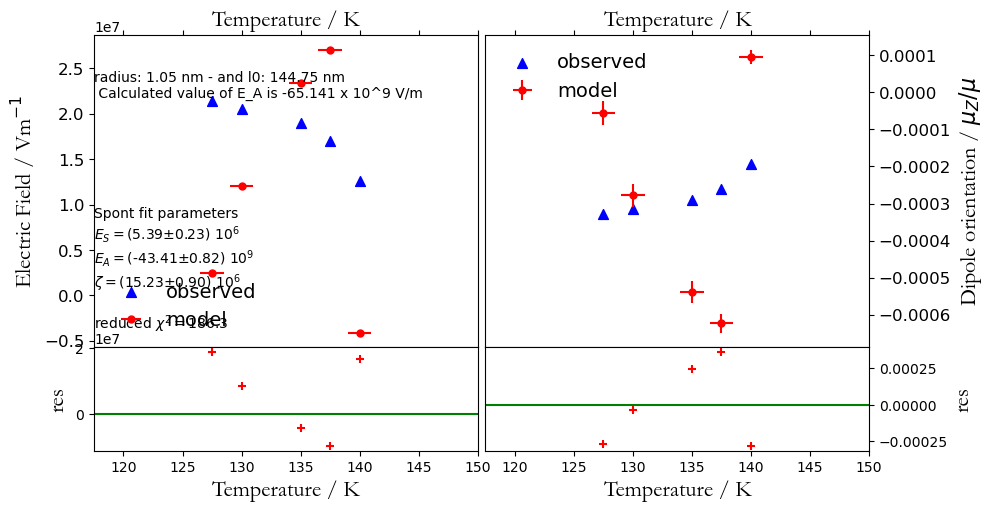

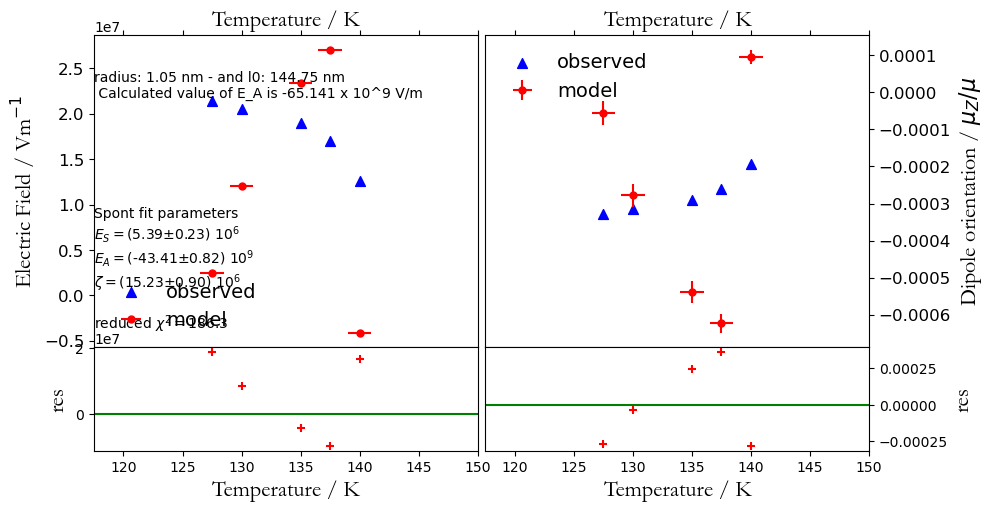

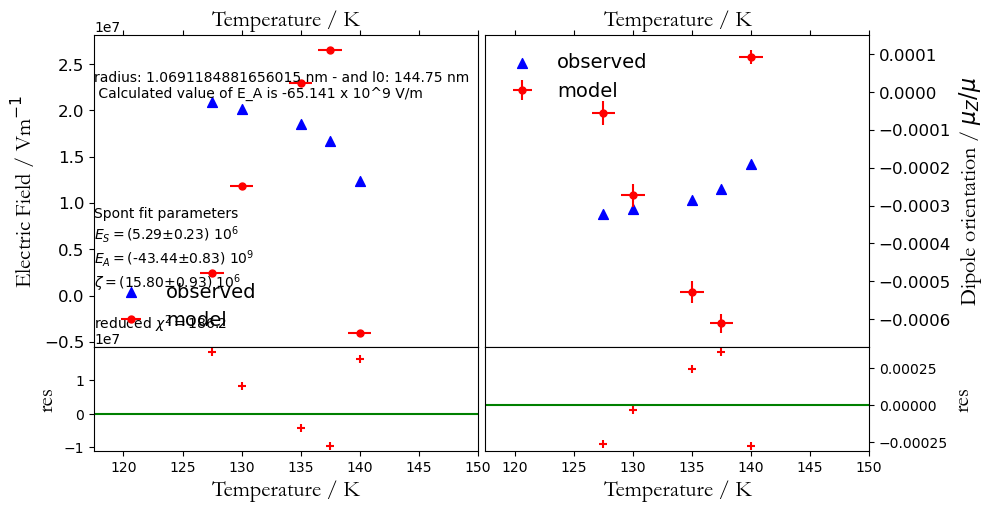

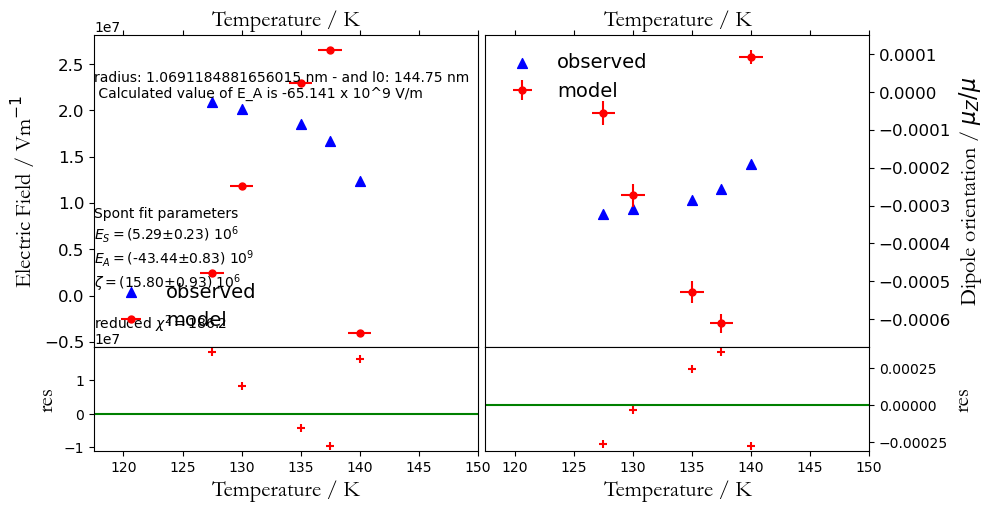

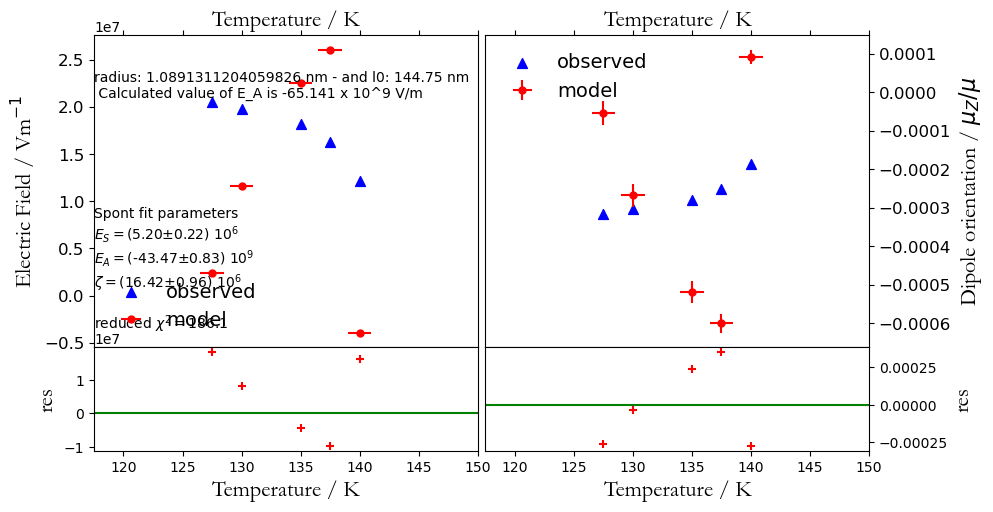

...

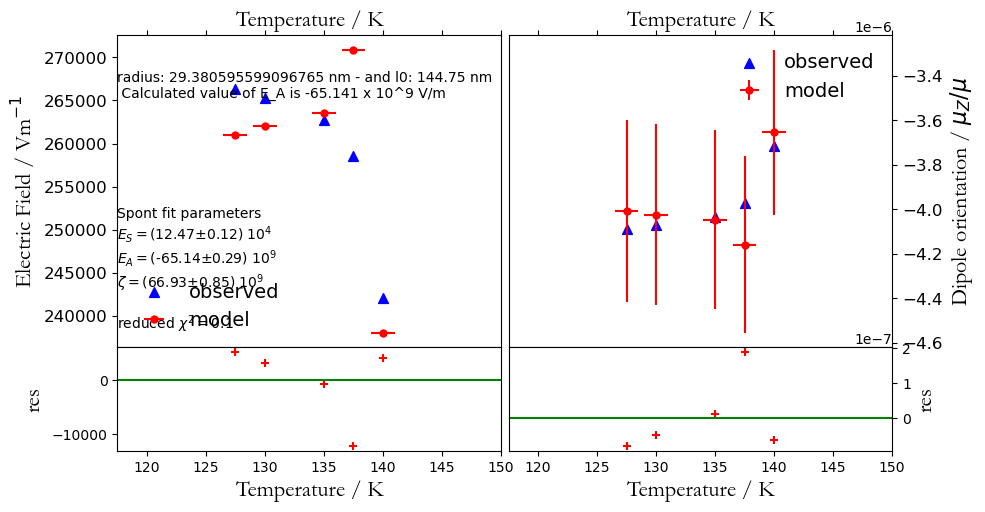

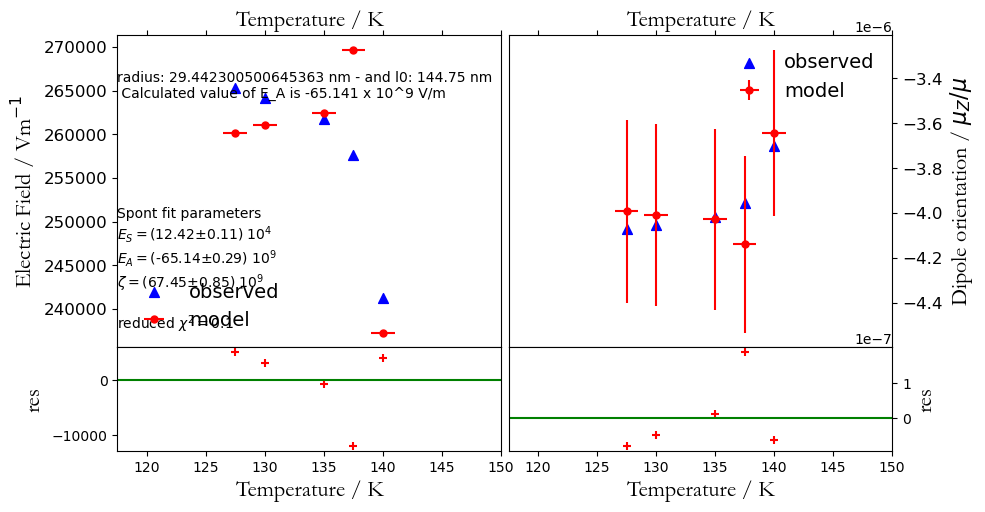

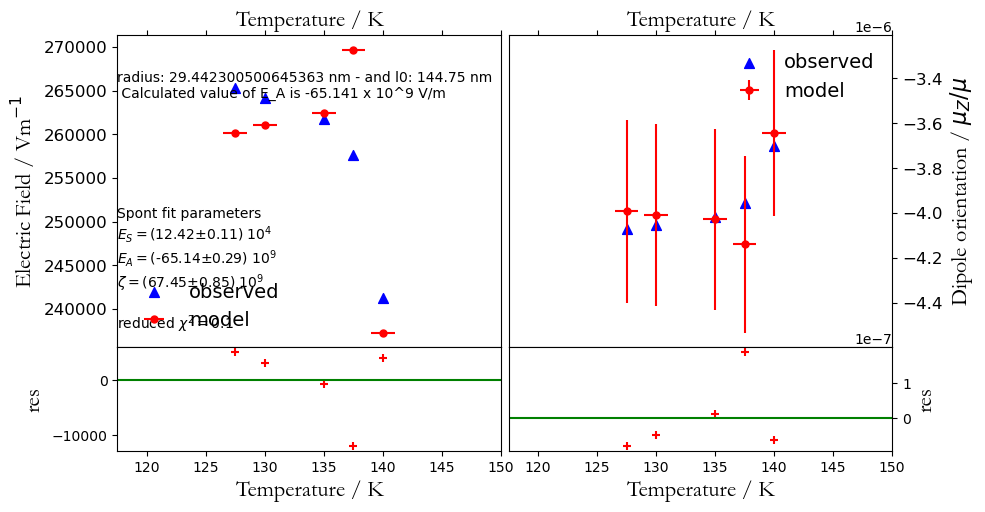

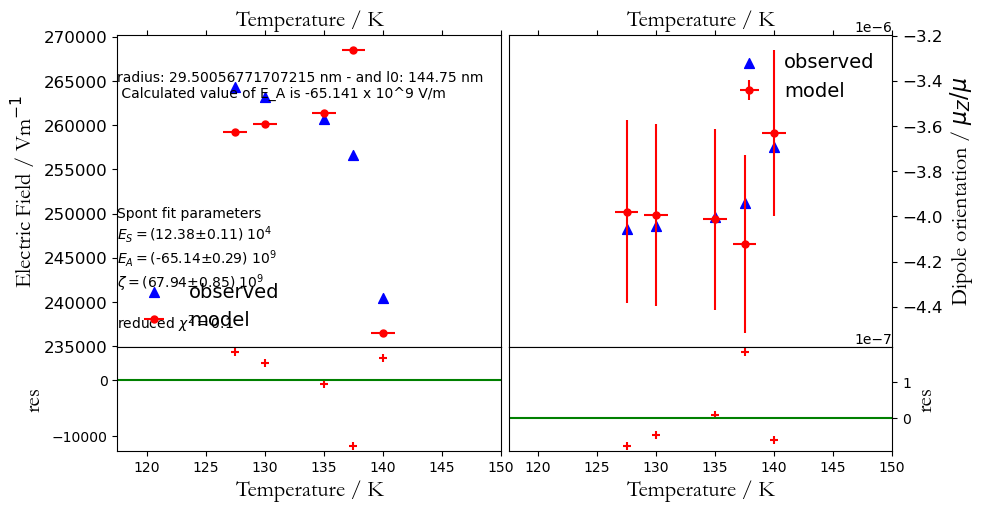

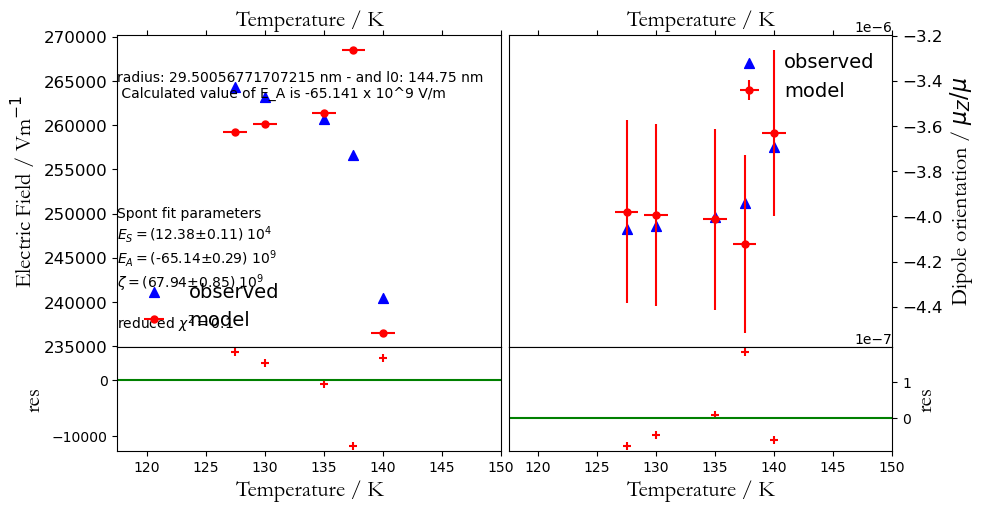

In [40]:
r_nm = 1.05 # best guess at initial "r" in _nm
r_0 = r_nm*18.897259886 #convert radius_nm to au

keep_results = []

#answer = calc_Esp(r_0, DE)

answer = optimize.newton(function_to_minimise, r_0, der_function_to_minimise, maxiter = 70, full_output= True, disp=True) 

keep_results_array = np.array(keep_results)

print(keep_results_array)

#### 




             r        result       r_nm
0    19.842123  5.400467e+06   1.050000
1    20.203410  5.401687e+06   1.069118
2    20.581594  5.402975e+06   1.089131
3    20.977974  5.404335e+06   1.110107
4    21.393993  5.405774e+06   1.132121
..         ...           ...        ...
65  552.662422  2.251623e+06  29.245638
66  553.976068  2.243402e+06  29.315153
67  555.212751  2.235697e+06  29.380596
68  556.378804  2.228468e+06  29.442301
69  557.479895  2.221667e+06  29.500568

[70 rows x 3 columns]


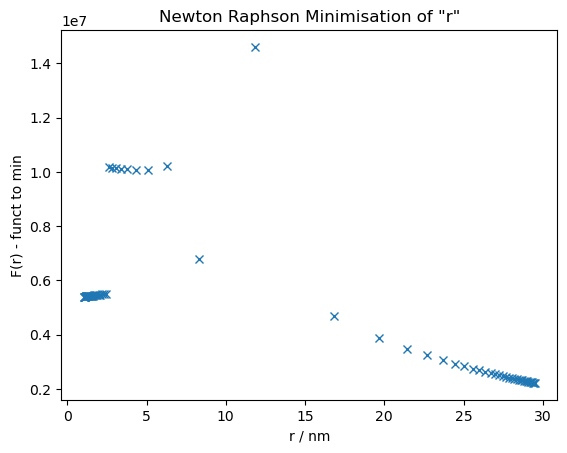

In [41]:

df = pd.DataFrame(keep_results, columns=['r', 'result'])
df['r_nm'] = df['r']/18.897259886

plt.plot(df['r_nm'],df['result'],'x' )
plt.xlabel('r / nm')
plt.ylabel('F(r) - funct to min')
plt.title('Newton Raphson Minimisation of "r"')


print(df)




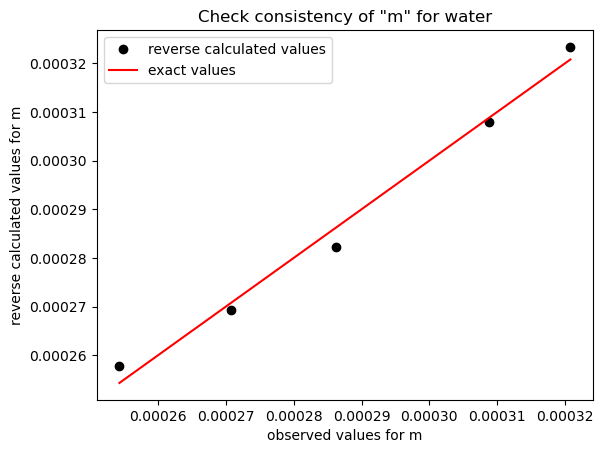

In [65]:
#Need a consistency check to make sure that the calculated fitting parameters give sensible values of dipole alignment

#**NOTE: Everything in au!**

ES_test=(EScur/5.14220652e+11)
EA_test=(EAcur/5.14220652e+11)
zeta_test=(zetacur)

m_check= - (T/(mu_0*((-EA_test*muz_mu0_array)+ES_test*(1+(muz_mu0_array**2)*zeta_test)))) + 1/(np.tanh((mu_0*(-EA_test*muz_mu0_array+ES_test*(1+(muz_mu0_array**2)*zeta_test)))/T))
figofmerit= np.sum(((m_check-muz_mu0_array)**2)**0.5) #some estimate of errors based on least squares regression


plt.plot(muz_mu0_array,m_check,'ko', label = 'reverse calculated values')
plt.plot(muz_mu0_array,muz_mu0_array,'r', label = 'exact values')


plt.xlabel('observed values for m')
plt.ylabel('reverse calculated values for m')
plt.title('Check consistency of "m" for '+name)
plt.legend()




In [23]:
#Define the relevant functions

def Langevin(x):
#
# the Langevin function for a single real argument x
# for small absolute values of x (<1.0e-6) an approximation is used that is
# correct to second order, i.e. the error term is O(eps^3)
#
    if (abs(x)>1.0e-6) :
        y=math.cosh(x)/math.sinh(x)-1/x
    else :
        y=x/3.0
    return y

def DerLangevin(x):
#
# the derivative of the Langevin function for a single real argument x
# for small absolute values of x (<1.0e-6) an approximation is used that is
# correct to second order, i.e. the error term is O(eps^2)
#
    if (abs(x)>1.0e-6) :
        auxden=1.0/math.sinh(x)
        y=-1.0*auxden*auxden+1.0/x/x
    else :
        y=1.0/3.0
    return y

def DDerLangevin(x):
#
# the second derivative of the Langevin function for a single real argument x
# for small absolute values of x (<1.0e-6) an approximation is used that is
# correct to second order, i.e. the error term is O(eps^2)
#
    if (abs(x)>1.0e-6) :
        auxden=1.0/math.sinh(x)
        y=2.0*(math.cosh(x)*auxden*auxden*auxden-1.0/x/x/x)
    else :
        y=0.0
    return y

def LangevInv(y):
#
# the inverse of the Langevin function for a single real argument y
# this uses an expression derived by Petrosyan (2017)
# 02/06/2022 (FPP): the approximation is only correct for positive values of the argument, so
#   in order to also work for negative values I have modified the function.
#
    if (abs(y)<1.0) :
        yab=abs(y)
        x=y*(3.0+yab*math.sin(7.0*yab/2.0)/5.0+yab*yab/(1-yab))
        return x
    else :
        print("LangevInv: argument out of range, stopping.")
        return

def DerLangevInv(y):
#
# the derivative of the inverse of the Langevin function for a single real argument y
# this uses an expression for the inverse of the Langevin function derived by Petrosyan (2017)
# 02/06/2022 (FPP): the approximation is only correct for positive values of the argument, so
#   in order to also work for negative values I have modified the function.
#
    if (abs(y)<1.0) :
        yab=abs(y)
        x=3.0+2.0*yab*math.sin(7.0*yab/2.0)/5.0+7.0*yab*yab*math.cos(7.0*yab/2.0)/10.0
        x+=(3.0-2.0*yab)*yab*yab/(1-yab)/(1-yab)
        return x
    else :
        print("DerLangevInv: argument out of range, stopping.")
        return
    
def NeaterOut(x,s):
#
# prepares the strings for providing nicer-looking output of parameters with uncertainties
    spon=math.floor(math.log10(abs(s)))+1
    divis=math.exp(spon*math.log(10))
    xout=x/divis
    sout=s/divis
    string='({0:.2f}$\pm${1:.2f}) $10^{2:n}$'.format(xout,sout,spon)
    return string

def ConstrLSQ(x,y,wht):
#
# Solve a linear least squares problem for 1 dependent variable y as a function of
# nvar independent variables x.
# Linear least-squares problems for more than 1 parameter require a matrix inversion
# Here for arbitrary numbers of parameters the required matrix elements are 
# calculated and the matrix is inverted, after which the parameters are obtained.
# Input: a matrix x[nvar,ndat] containing ndat measurements of nvar independent
#           variables x
#        a vector y[ndat] containing the dependent variable
#        a vector of weights [ndat] which is used to give particular measurements 
#           less weight if desired. 
# NOTE: if a constant offset is required as one of the free parameters, an x-variable 
# which is all 1's must be present in (added to) the input matrix x.
#
    if (x.shape[1] != y.shape[0]) :
        print("ConstrLSQ: unequal array lengths, stopping.")
        par=numpy.array([])
        return
    if (x.shape[1] != wht.shape[0]) :
        print("ConstrLSQ: unequal array lengths, stopping.")
        par=numpy.array([])
        return

#
# declaration of local variables
    ndat=xdat.shape[1]
    nvar=xdat.shape[0]
    whtsum=0.0
    ysum=0.0
    xsum=numpy.array([0.0]*nvar)
    xysum=numpy.array([0.0]*nvar)
    xsqsum=numpy.array([[0.0]*2,[0.0]*2])
    Ainv=numpy.array([[0.0]*2,[0.0]*2])
    par=numpy.array([0.0]*nvar)
#
# weighted sum of measurements of dependent variable 
    for i in range(0,ndat):
        ysum+=y[i]*wht[i]
#
# weighted sum of measurements of independent variables and of cross-products on independent variables
# with each other and with dependent variable.
    for k in range(0,nvar):
        for i in range(0,ndat):
            whtsum+=wht[i]
            xsum[k]+=x[k,i]*wht[i]
            xysum[k]+=x[k,i]*y[i]*wht[i]
        for l in range(0,nvar):
            for i in range(0,ndat):
                xsqsum[k,l]+=x[k,i]*x[l,i]*wht[i]
#
# start solving the set of linear equations for the linear least squares problem
    if (nvar==1) :
#
# if only one parameter to be determined
        par[0]=ysum/xsum[0]
    else:
#
# for determination of 2 parameters
        if (nvar==2) :
            Det=xsqsum[0,0]*xsqsum[1,1]-xsqsum[1,0]*xsqsum[0,1]
            if (abs(Det)>1.0e-9) :
                Ainv[0,0]=xsqsum[1,1]/Det
                Ainv[0,1]=-1.0*xsqsum[0,1]/Det
                Ainv[1,0]=-1.0*xsqsum[1,0]/Det
                Ainv[1,1]=xsqsum[0,0]/Det
                par[0]=Ainv[0,0]*xysum[0]+Ainv[0,1]*xysum[1]
                par[1]=Ainv[1,0]*xysum[0]+Ainv[1,1]*xysum[1]
            else :
                print("ConstrLSQ: singular matrix. stopping")
                par=numpy.array([])
                return
        else :
#
# the general case of 3 or more parameters to be determined.
            Ainv=numpy.linalg.inv(xsqsum)
            par=numpy.dot(Ainv,xysum)
#
    return par

# Define several conversion factors to/from atomic units
# conversion of Temp to a.u. : T [a.u.]= T [K]/factor
Ttoau=315770.0
# conversion of D to a.u. : 1 D (=Debye) = factor [a.u.]
Debye=0.393456
# Convert el. field in a.u. To V/m : E [a.u.] = E [V/m]/factor
Etoau=5.142e11
#

I have a mesh with  8  values of r;  1  values of l0 and  5  spaces for E field values


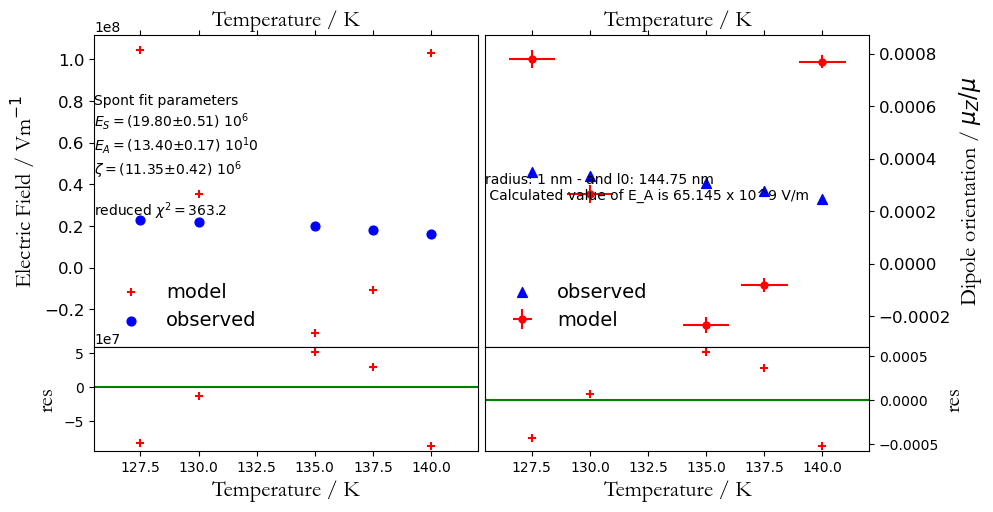

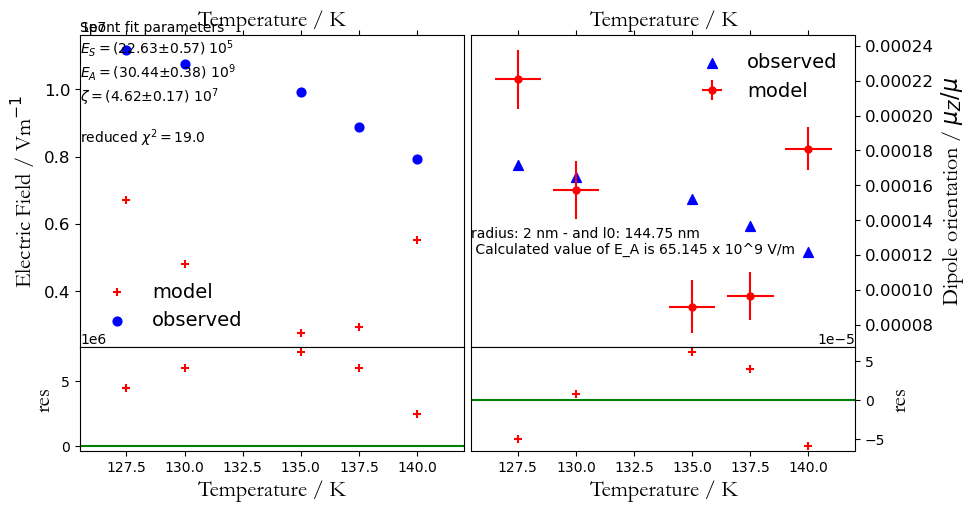

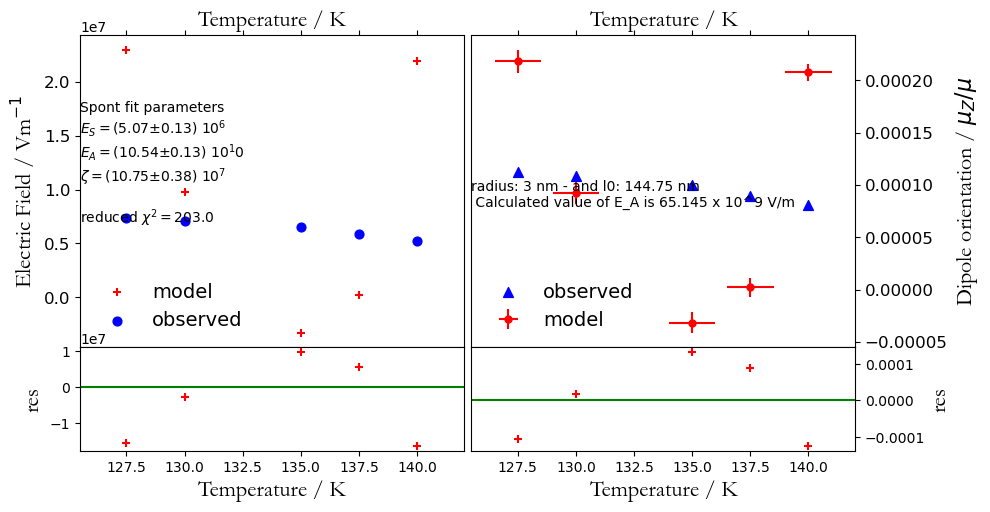

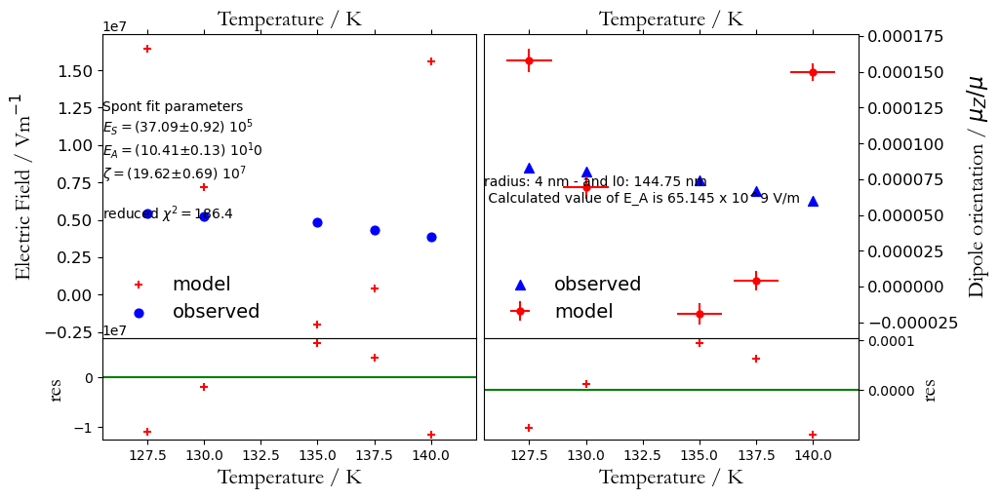

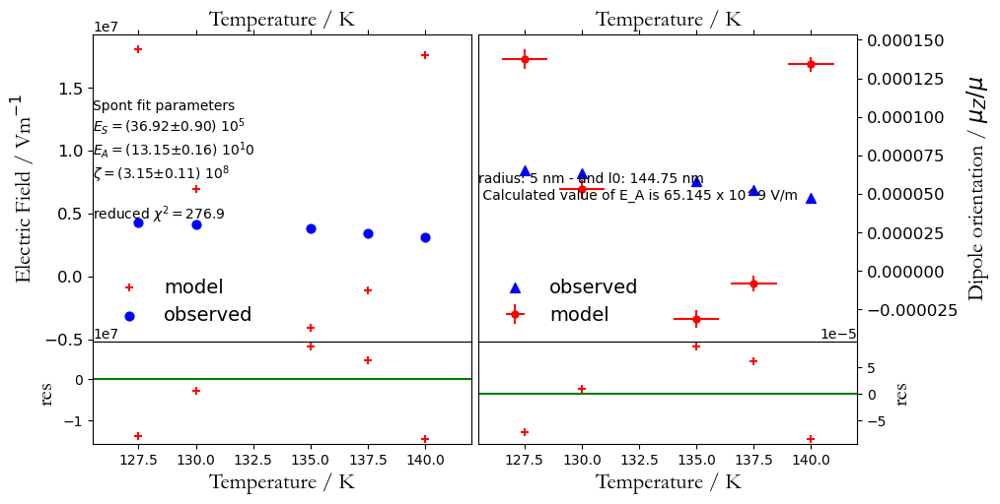

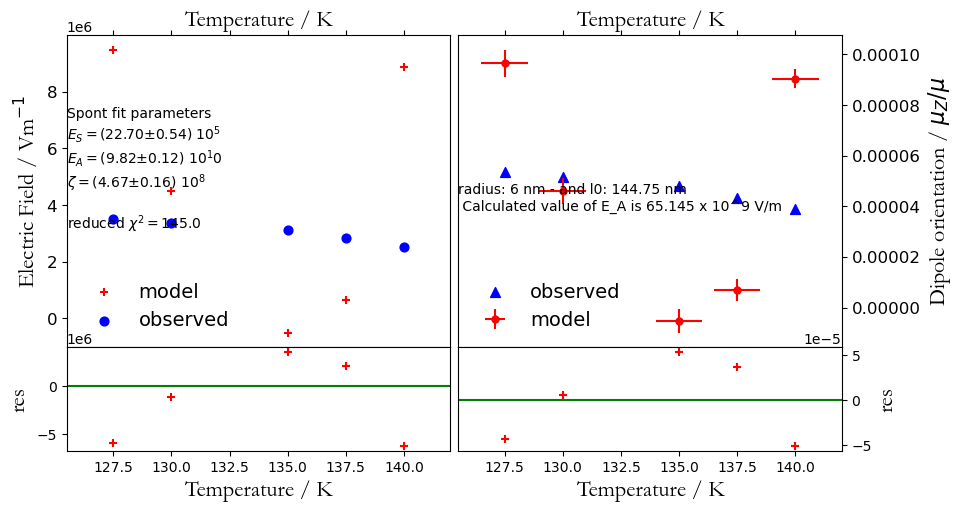

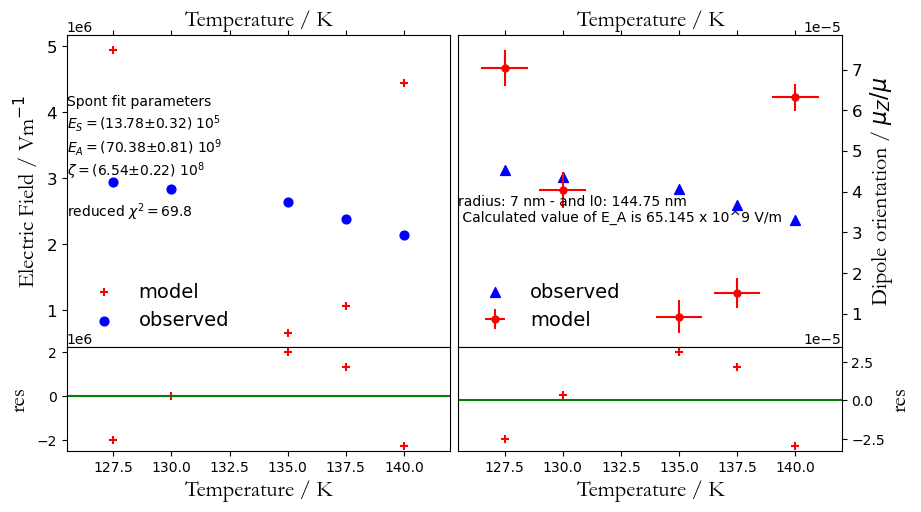

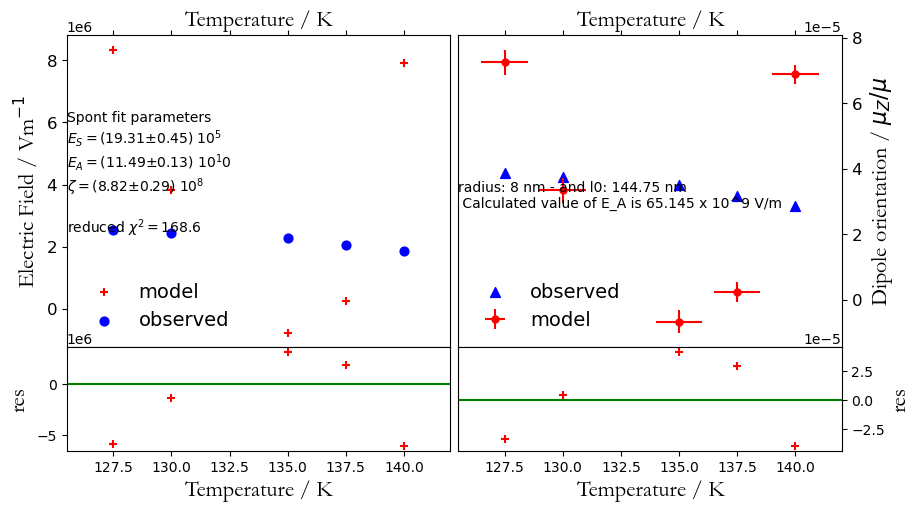

In [25]:

r_nm_values = np.array([1,2,3,4,5,6,7,8])
l0_values = np.array([144.75])

r_nm_values_2D, l0_values_2D = np.meshgrid(r_nm_values, l0_values)
r_nm_values_3D, l0_values_3D, Efield_3D = np.meshgrid(r_nm_values, l0_values, Temp)

chi2_values = np.zeros(r_nm_values_2D.shape)
figofmerit_values_m = np.zeros(r_nm_values_2D.shape)
figofmerit_values_E = np.zeros(r_nm_values_2D.shape)
all_obs_E_field = np.zeros(r_nm_values_3D.shape)

print('I have a mesh with ', r_nm_values_3D.shape[1], ' values of r; ', r_nm_values_3D.shape[0] ,' values of l0 and ', r_nm_values_3D.shape[2],' spaces for E field values')

eps = (1.70172) #epsilon - usually take (refractive index)**2  - Kofman_2019_ApJ 
s_nm = 0.37 # David provided this value
mu_0_Debye = 3 # solid state dipole moment since this is known for water and avoids us recalculating it with topping equation
Omega_SI = 17.35e-30 # volume in m**3 from saga et al. (normally calculated based on polarizability, but don't do it this way for water ice).

#find the peak fit data
#os.chdir(working_dir)  
df = pd.read_csv(filename+'.txt', delim_whitespace=True, header=(0))
xdataraw = df.iloc[:,0] #Temperature K
ydataraw = df.iloc[:,1] #peak position nm      
        
#set up some graph parameters
T_array=xdataraw.to_numpy()
xmin_mu=min(T_array - 2)
xmax_mu=max(T_array + 2)
xmin=min(T_array - 2)
xmax=max(T_array + 2)
       
#convert units
lambda_nm=ydataraw
lambda_eV=1239.8/lambda_nm

for loop_index_i in range(r_nm_values_2D.shape[0]):
    for loop_index_j in range(r_nm_values_2D.shape[1]):
        #define i and j place in the matrix by scrolling through r and l0 values
        r_nm = r_nm_values_2D[loop_index_i, loop_index_j]
        l0 = l0_values_2D[loop_index_i, loop_index_j]
        r_i=str(r_nm)
        l0_j=str(l0)
        ij_space=('radius: '+r_i+' nm - and l0: '+l0_j+' nm')
        
        l0_eV=1239.8/l0
        DE_eV=(l0_eV-lambda_eV)
        #convert things to atomic units
        T=xdataraw*3.16683e-6
        DE=DE_eV*0.036749405469679
        r=r_nm*18.897259886  #radius in atomic units

        #Calculate the "observed" value of E field, based on an exciton expansion model        
        Esp_au=(1/96)*(
            -((32*DE)/r)
            +(
                (16*(2**(1/3))*DE*(6+DE*eps*r))
                /
                (r**3 *
                ((((DE**2*eps**2 *r**(0.5))*(-9+2*DE*eps*r))+3*(3**(0.5))*(-DE**3 *eps**3 *(32+DE*eps*r*(13+4*DE*eps*r)))**0.5)
                /
                (r**(9/2))
                )**(1/3)
                )
            )
            +
            (
                (8*(2**(2/3))*
                ((((DE**2 *eps**2 *r**(0.5))*(-9+2*DE*eps*r))+3*(3**(0.5))*(-DE**3 *eps**3 *(32+DE*eps*r*(13+4*DE*eps*r)))**0.5)
                /
                 (r**(9/2))
                )**(1/3))
                /
                (eps))
        )

        Esp_Vm=Esp_au*5.14220652e+11
        Esp_Vm_array=Esp_Vm.to_numpy()
        ymin=min(Esp_Vm_array) - 0.01*(Esp_Vm_array[-1])
        ymax=max(Esp_Vm_array) + 0.01*(Esp_Vm_array[-1])
        
        #Convert this E field into degree of dipole alignment
        #first calculate E_a        
        s = (s_nm)*18.897  # estimated layer spacing converted to au
        mu_0 = (mu_0_Debye*0.393456)  #  solid state dipole converted to au

        Omega = Omega_SI*18897259886**3 # convert volume to au
        water_radius_AU = ((3/(4*np.pi))**(1/3))*(Omega**(1/3))
        
        E_A=4*np.pi*mu_0/Omega
        E_A_Vm = E_A*5.14220652e+11      

        degree_of_alignment=Esp_Vm/E_A_Vm
        muz_mu0_array=degree_of_alignment.to_numpy()
        ymin_mu=min(muz_mu0_array) - 0.01*(muz_mu0_array[-1])
        ymax_mu=max(muz_mu0_array) + 0.01*(muz_mu0_array[-1])
       
        #now save E_sp and degree_of_alignment to a file to access later
        length=(len(T_array))
        np.ones(length)
        err_muz_mu0=0.1*(muz_mu0_array)
        err_T=np.ones(length)   #0.1*(T_array)
        
        os.chdir('observed_data')
        data=np.column_stack((weight,muz_mu0_array,err_muz_mu0,T_array,err_T,Esp_Vm_array))#,mu_0,E_A_Vm))
        header='weight,y,sigma_y,Temperature,sigma_T,Observed_field'

        with open('data for_'+name+'.csv', mode='w', ) as newfile: 
            np.savetxt(newfile,data, header=header,delimiter=',',comments='') 
    
        os.chdir('..')  
        
        os.chdir('observed_data')
		
        SpontelData = pandas.read_csv('data for_'+name+'.csv')
        os.chdir('..') 
        #SpontelData.head()
    # Main driver programme for fitting Spontelectric field data
    # 
    # Define several conversion factors to/from atomic units
    # conversion of Temp to a.u. : T [a.u.]= T [K]/factor
        Ttoau=315770.0
    # conversion of D to a.u. : 1 D (=Debye) = factor [a.u.]
        Debye=0.393456
    # Convert el. field in a.u. To V/m : E [a.u.] = E [V/m]/factor
        Etoau=5.142e11
 
        htfc=numpy.array([0.0]*4)
 
    # Find the value of mu for this ice 
        IceMu=mu_0_Debye
    
    # Provide a first guess value for the parameter E_A
        EAnxt=E_A_Vm
    
        htfc[0]=1.0
        htfc[1]=0.0
        htfc[2]=0.0
        htfc[3]=0.0
    
        weight=numpy.array(SpontelData.weight)
        ndata=len(weight)
    # y is the same as <mu_Z>/mu, Temp is the deposition temperature in [K]
    # sig are the 1-sigma measurement errors
    # E observed is the observed Electric field in units [V/m]
        y=numpy.array(SpontelData.y)
        sigy=numpy.array(SpontelData.sigma_y)
        Temp=numpy.array(SpontelData.Temperature)
        sigT=numpy.array(SpontelData.sigma_T)
        Eobs=numpy.array(SpontelData.Observed_field)
    #
    # here comes a block of variable declarations
        whtsum=0.0
        yinvmn=0.0
        hTfunc=numpy.array([0.0]*ndata)
        DerhTfunc=numpy.array([0.0]*ndata)
        DerGT=numpy.array([0.0]*ndata)
        DerGy=numpy.array([0.0]*ndata)
        PartDerv=numpy.array([[0.0]*ndata,[0.0]*ndata,[0.0]*ndata,[0.0]*ndata])
        xdat=numpy.array([[0.0]*ndata,[0.0]*ndata])
        ydat=numpy.array([0.0]*ndata)
        zdat=numpy.array([0.0]*ndata)
        ymodel=numpy.array([0.0]*ndata)
        DParDy=numpy.array([[0.0]*ndata,[0.0]*ndata,[0.0]*ndata])
        DParDT=numpy.array([[0.0]*ndata,[0.0]*ndata,[0.0]*ndata])
        SigPar=numpy.array([0.0]*3)
#
#
# Auxiliary functions f_0, f_1, f_2, and f_3 are needed as input for linear least-squares
# These are named here as PartDerv[0,], ..., PartDerv[3,] because these are also the
# partial derivatives of the function G with respect to T and y.
        for i in range(0,ndata):
            yinvmn+=weight[i]/y[i]
            whtsum+=weight[i]
            hTfunc[i]=htfc[0]+Temp[i]*(htfc[1]+Temp[i]*(htfc[2]+Temp[i]*htfc[3]))
            DerhTfunc[i]=htfc[1]+Temp[i]*(2.0*htfc[2]+3.0*Temp[i]*htfc[3])
            PartDerv[0,i]=(1-y[i])*LangevInv(y[i])
            PartDerv[1,i]=Ttoau*Debye*IceMu*(y[i]-1.0)/Temp[i]
            PartDerv[2,i]=-1.0*PartDerv[1,i]*y[i]
            PartDerv[3,i]=PartDerv[1,i]*y[i]*y[i]*hTfunc[i]
#
# start the iteration to get the parameters, initialise a choice for E_A
        yinvmn=yinvmn/whtsum
        EAcur=1.1*EAnxt
        itcnt=0
        while ((abs(EAnxt/EAcur-1.0)>1.0e-3) and (itcnt<20)) :
            itcnt+=1
            EAcur=EAnxt
            for i in range(0,ndata):
                xdat[0,i]=PartDerv[1,i]
                xdat[1,i]=PartDerv[3,i]
                ydat[i]=-1.0*(PartDerv[0,i]+EAcur*PartDerv[2,i]/Etoau)
#
            Constrout=ConstrLSQ(xdat,ydat,weight)
#
# FPP (02/06/2022): here E_S and zeta always are forced to be >= 0
            EScur=abs(Constrout[0]*Etoau)
            ESzetacur=abs(Constrout[1]*Etoau)
            ratiolog=0.0
            for i in range(0,ndata) :
                Ezmod=(EScur-EAcur*y[i]+ESzetacur*hTfunc[i]*y[i]*y[i])*IceMu*Ttoau*Debye/Etoau/Temp[i]
                ratiolog+=weight[i]*(math.log(abs(EAcur*Langevin(Ezmod)))-math.log(Eobs[i]))
                DerGy[i]=(EScur-ESzetacur*hTfunc[i]*y[i]*(2.0-3.0*y[i])+EAcur*(1.0-2.0*y[i]))*IceMu*Ttoau*Debye/Etoau/Temp[i]
                DerGy[i]+=-1.0*LangevInv(y[i])+(1.0-y[i])*DerLangevInv(y[i])
                DerGT[i]=(EScur*(1-y[i])-EAcur*y[i]*(1-y[i])+ESzetacur*hTfunc[i]*y[i]*y[i]*(1-y[i]))*IceMu*Ttoau*Ttoau*Debye/Etoau/Temp[i]/Temp[i]
                DerGT[i]+=-1.*ESzetacur*DerhTfunc[i]*y[i]*y[i]*(1-y[i])*IceMu*Ttoau*Debye/Etoau/Temp[i]
            ratiolog=ratiolog/whtsum
            if ((Constrout[0]<0) and (EAcur<0) and (yinvmn<0) and (ratiolog>0)) :
                EAnxt=EAcur+2.0*yinvmn*EScur
            else :
                EAnxt=EAcur/math.exp(ratiolog)
            if (itcnt>40) : 
                print ("iteration count exceeded: not converged")
#
# for the calculation of the uncertainty margins for the parameters the partial derivatives below are needed
#
# also calculate the quality of the fit (chi-square) dlsqsum
        dlsqsum=0
        for i in range(0,ndata) :
            ymodel[i]=Langevin((EScur-EAcur*y[i]+ESzetacur*hTfunc[i]*y[i]*y[i])*IceMu*Ttoau*Debye/Etoau/Temp[i])
            DelMod=y[i]-ymodel[i]
            dlsqsum+=weight[i]*DelMod*DelMod/sigy[i]/sigy[i]
        #print(i,weight[i]*DelMod*DelMod/sigy[i]/sigy[i])
            DParDy[0,i]=-1.0*DerGy[i]/PartDerv[1,i]
            DParDy[1,i]=-1.0*DerGy[i]/PartDerv[2,i]
            DParDy[2,i]=-1.0*DerGy[i]/PartDerv[3,i]
            DParDT[0,i]=-1.0*DerGT[i]/PartDerv[1,i]
            DParDT[1,i]=-1.0*DerGT[i]/PartDerv[2,i]
            DParDT[2,i]=-1.0*DerGT[i]/PartDerv[3,i]
#
        dlsqsum=dlsqsum/(whtsum-2)
# calculate the 1-sigma uncertainties for the parameters
        for k in range(0,3):
            for i in range(0,ndata) :
                SigPar[k]+=weight[i]*(DParDy[k,i]*DParDy[k,i]*sigy[i]*sigy[i]+DParDT[k,i]*DParDT[k,i]*sigT[i]*sigT[i]/Ttoau/Ttoau)
            SigPar[k]=Etoau*math.sqrt(SigPar[k]/whtsum)  

        zetacur=ESzetacur/EScur
        ymodel_E=EAcur*ymodel

#Define text to print on each graph
        SigPar[2]=zetacur*math.sqrt(SigPar[2]*SigPar[2]/ESzetacur/ESzetacur+SigPar[0]*SigPar[0]/EScur/EScur)
        string = 'Spont fit parameters'
        string+="\n"+"$E_S =$"+NeaterOut(EScur,SigPar[0])
        string+="\n"+"$E_A =$"+NeaterOut(EAcur,SigPar[1])
        string+="\n"+"$\zeta =$"+NeaterOut(zetacur,SigPar[2])
        string+="\n\n"+"reduced $\chi^2 =$"+'{0:.1f}'.format(dlsqsum)+"\n"

        annotate=(string)

#define residuals for plot (just for visualising)
        res_E=Eobs-ymodel_E
        res_mu=y-ymodel
      
#FigureMu(Temp,ymodel,y,sigT,sigy,xmin_mu,xmax_mu,ymin_mu,ymax_mu,name)
#ymodel=EAcur*ymodel
#FigureE(Temp,ymodel,Eobs,xmin,xmax,ymin,ymax,name)

        fig, ax = plt.subplots(2, 2, sharex=True, gridspec_kw={'height_ratios':[3,1]}, figsize=(10, 5.4))
        fig.subplots_adjust(hspace=0)
        fig.subplots_adjust(wspace=0.02)
        
#plt.title(ij_space)
        ax[0,0].set_xlim(xmin, xmax)
        #ax[0,0].set_ylim(ymin, ymax)
        ax[0,0].scatter(Temp, ymodel_E, marker='+', s=40, color='red', label='model')
        ax[0,0].scatter(Temp, Eobs, marker='o', s=40, color='blue', label='observed')
    #ax.set_yticks(tick)
        ax[0,0].set_xlabel('Temperature / K', fontsize=16, fontname='garamond')
        ax[0,0].xaxis.set_label_position("top")
        ax[0,0].xaxis.tick_top()
        ax[0,0].set_ylabel('Electric Field / Vm$^{-1}$', fontsize=16, fontname='garamond')
        ax[0,0].tick_params(labelsize='large')
        ax[0,0].legend(loc=0, fontsize=14, framealpha=0)
        ax[0,0].text(xmin,ymin,annotate)
    
        ax[0,1].set_xlim(xmin_mu, xmax_mu)
        #ax[0,1].set_ylim(ymin_mu, ymax_mu)
        ax[0,1].errorbar(Temp, ymodel, markersize=10, xerr=sigT, yerr=sigy, fmt='.', color='red', label='model')
        ax[0,1].scatter(Temp, y, marker='^', s=50, color='blue', label='observed')
        ax[0,1].set_xlabel('Temperature / K', fontsize=16, fontname='garamond')
        ax[0,1].xaxis.set_label_position("top")
        ax[0,1].xaxis.tick_top()
        ax[0,1].yaxis.set_label_position("right")
        ax[0,1].yaxis.tick_right()
        ax[0,1].set_ylabel('Dipole orientation / $\mu_Z/\mu$', fontsize=16, fontname='garamond')
        ax[0,1].tick_params(labelsize='large')
        ax[0,1].legend(loc=0, fontsize=14, framealpha=0)
        ax[0,1].text(xmin_mu,ymin_mu,ij_space+'\n Calculated value of E_A is '+str(round(E_A_Vm/1E9,3))+' x 10^9 V/m')
#ax[0,1].text(20,0,legend_mu)
    
        ax[1,0].scatter(Temp, res_E, marker='+', s=40, color='red', label='observed')
        ax[1,0].axhline(y = 0.0, color = 'g', linestyle = '-')
        ax[1,0].set_xlabel('Temperature / K', fontsize=16, fontname='garamond')
        ax[1,0].set_ylabel('res', fontsize=16, fontname='garamond')
    
        ax[1,1].scatter(Temp, res_mu, marker='+', s=40, color='red', label='observed')
        ax[1,1].yaxis.set_label_position("right")
        ax[1,1].axhline(y = 0.0, color = 'g', linestyle = '-')
        ax[1,1].yaxis.tick_right()
        ax[1,1].set_xlabel('Temperature / K', fontsize=16, fontname='garamond')
        ax[1,1].set_ylabel('res', fontsize=16, fontname='garamond')
       

        
        short_ij=('r_'+str(r_nm)+'_lambda0_'+str(l0))
        os.chdir('Spont fit')
        plt.savefig('Spont fit for'+short_ij+'.png')    
    
        zetacur=ESzetacur/EScur
        
        SigPar[2]=zetacur*math.sqrt(SigPar[2]*SigPar[2]/ESzetacur/ESzetacur+SigPar[0]*SigPar[0]/EScur/EScur)
        string = name
        string+="<br>"+"$E_S =$"+NeaterOut(EScur,SigPar[0])
        string+="<br>"+"$E_A =$"+NeaterOut(EAcur,SigPar[1])
        string+="<br>"+"$\zeta =$"+NeaterOut(zetacur,SigPar[2])
        string+="<br><br>"+"reduced $\chi^2 =$"+'{0:.1f}'.format(dlsqsum)+"<br>"
        #display(Markdown(string)) #Use this line to see the individual results for fitting parameters per dataset
    
        ES=NeaterOut(EScur,SigPar[0])
        EA=NeaterOut(EAcur,SigPar[1])
        zeta=NeaterOut(zetacur,SigPar[2])
        os.chdir('..')  
        
        chi2_values[loop_index_i, loop_index_j] = dlsqsum
        ES_test=(EScur/5.14220652e+11)
        EA_test=(EAcur/5.14220652e+11)
        zeta_test=(zetacur)

        m_check= - (T/(mu_0*((-EA_test*muz_mu0_array)+ES_test*(1+(muz_mu0_array**2)*zeta_test)))) + 1/(np.tanh((mu_0*(-EA_test*muz_mu0_array+ES_test*(1+(muz_mu0_array**2)*zeta_test)))/T))
        E_check = np.sum(((ymodel_E-Eobs)**2)**0.5)
        figofmerit_E = E_check #some estimate of errors based on least squares regression
        figofmerit_m = np.sum(((m_check-muz_mu0_array)**2)**0.5) 
        
        figofmerit_values_m[loop_index_i, loop_index_j] = figofmerit_m
        figofmerit_values_E[loop_index_i, loop_index_j] = figofmerit_E
                
        #Also, save the plots of each obs E field, because this changes a lot as r and l0 vary
        
        for loop_index_z in range(r_nm_values_3D.shape[2]):    
            Efield = Eobs[loop_index_z]   
            all_obs_E_field[loop_index_i, loop_index_j, loop_index_z] = Efield                          
        

TypeError: Input z must be at least a (2, 2) shaped array, but has shape (1, 8)

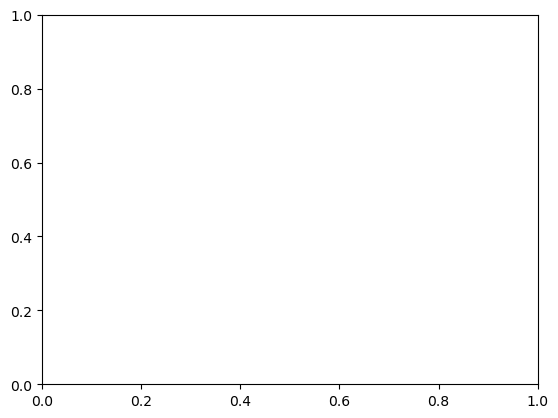

In [12]:
fig, ax = plt.subplots()

c = ax.contourf(r_nm_values, l0_values, chi2_values)

ax.set_xlabel('radius / nm', fontsize=16, fontname='garamond')
ax.set_ylabel('lambda_0 / nm', fontsize=16, fontname='garamond')
ax.set_title(name)

fig.colorbar(c, ax=ax)

plt.show()

TypeError: Input z must be at least a (2, 2) shaped array, but has shape (1, 8)

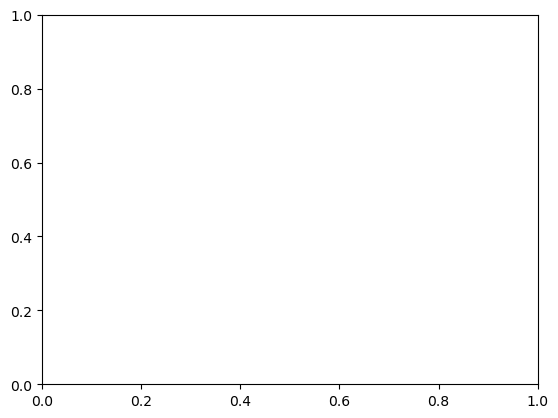

In [13]:
fig, ax = plt.subplots()

c = ax.contourf(r_nm_values, l0_values, figofmerit_values_m)

ax.set_xlabel('radius / nm', fontsize=16, fontname='garamond')
ax.set_ylabel('lambda_0 / nm', fontsize=16, fontname='garamond')
ax.set_title(name  + '  m as figure of merit')

fig.colorbar(c, ax=ax)

plt.show()

array_1d_m = figofmerit_values_m.reshape(-1)
nor_figofmerit_values_m=(figofmerit_values_m/max(array_1d_m))
inv_figofmerit_values_m=1-nor_figofmerit_values_m

fig, ax = plt.subplots()

c = ax.contourf(r_nm_values, l0_values, figofmerit_values_E)

ax.set_xlabel('radius / nm', fontsize=16, fontname='garamond')
ax.set_ylabel('lambda_0 / nm', fontsize=16, fontname='garamond')
ax.set_title(name + '  E as figure of merit')

fig.colorbar(c, ax=ax)

plt.show()

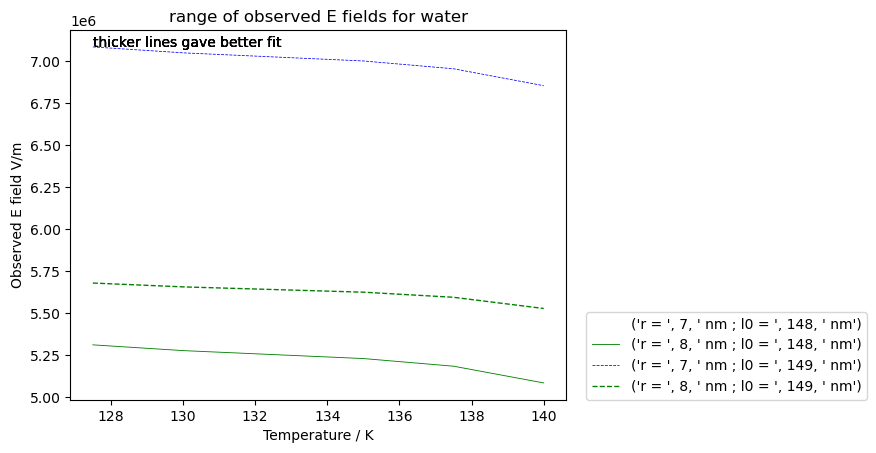

In [21]:

for wavelength_zero in range (r_nm_values_3D.shape[0]):
    colour_list=['b','g','c','k','r','y','m','b','g']
    line_style_list=['-','--',':','-.','-','--',':','-.','-','--']
    for radii in range(r_nm_values_3D.shape[1]):
        text_string = ('r = ', r_nm_values[radii], ' nm ; l0 = ', l0_values[wavelength_zero], ' nm')
        line_style=(colour_list[radii] + line_style_list[wavelength_zero])
        
        plt.plot(Temp, all_obs_E_field[wavelength_zero][radii], line_style, linewidth=2*inv_figofmerit_values_m[wavelength_zero][radii], label=text_string)
        #plt.yscale('log')
        plt.legend(loc=(1.04, 0))
        plt.title('range of observed E fields for '+name)
        plt.xlabel('Temperature / K')
        plt.ylabel('Observed E field V/m')
        plt.text(127.5,max(all_obs_E_field.reshape(-1)),'thicker lines gave better fit',)